In [1]:
import os
import sys
import anndata as ad
import scipy
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import scipy.io as sio
import scanpy.external as sce
import matplotlib.pyplot as plt
import re
import gseapy as gp
import anndata as ad
import statistics
import tempfile
import sklearn
import cosg
import leidenalg
import celltypist
import muon as mu
from tqdm import tqdm
sc._settings.n_jobs= 24
sc.settings.verbosity = 1
# Adjust Scanpy figure defaults
sc.settings.set_figure_params(dpi=100, fontsize=10, dpi_save=400,
    facecolor = 'white', figsize=(8,8), format='png')
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 100)
import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 100)

/home/liyanguo/anaconda3/envs/R45/lib/python3.13/site-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/home/liyanguo/anaconda3/envs/R45/lib/python3.13/site-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/home/liyanguo/anaconda3/envs/R45/lib/python3.13/site-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):


In [2]:
def check_dict_duplicates(dict):
    seen = set()
    dup = any(item in seen or seen.add(item) for lst in dict.values() for item in lst)
    if dup==False:
        return '无重复'
    else:
        return '有重复'

In [3]:
obj_path = '/home/liyanguo/MyImmuCell/05_MyImmuCell_subpopulation/Level2_Refine_R4/'

In [4]:
finnal_path = '/home/liyanguo/MyImmuCell/05_MyImmuCell_subpopulation/Finnal/'

In [5]:
leiden_groups=['L4_leiden_TOTALVI_0.1','L4_leiden_TOTALVI_0.5', 'L4_leiden_TOTALVI_1', 'L4_leiden_TOTALVI_1.5', 'L4_leiden_TOTALVI_0.3','L4_leiden_TOTALVI_0.8']

In [6]:
def get_annotation_data(celltype):
    adata = sc.read_h5ad(f"{obj_path}/{celltype}/{celltype}_count_scRNA.h5ad",backed='r')
    adt = sc.read_h5ad(f"{obj_path}/{celltype}/{celltype}_preprocess_scADT.h5ad")
    adata.obsm = adt.obsm
    
    # read Level1, tcr, bcr infor
    indices = pd.read_csv(f'{obj_path}/{celltype}/R4_indices_{celltype}.csv',index_col=0)
    # join leiden groups
    leiden_data = adt.obs.loc[:,leiden_groups]
    adata.obs = adata.obs.join(indices, how='left')
    adt.obs = adt.obs.join(indices, how='left')
    adata.obs = adata.obs.join(leiden_data, how='left')
    adata.strings_to_categoricals()
    return adata,adt,leiden_data

In [7]:
def get_norm_annotation_data(celltype):
    adata = sc.read_h5ad(f"{obj_path}/{celltype}/{celltype}_count_scRNA.h5ad")
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)
    adt = sc.read_h5ad(f"{obj_path}/{celltype}/{celltype}_preprocess_scADT.h5ad")
    adata.obsm = adt.obsm
    
    # read Level1, tcr, bcr infor
    indices = pd.read_csv(f'{obj_path}/{celltype}/R4_indices_{celltype}.csv',index_col=0)
    # join leiden groups
    leiden_data = adt.obs.loc[:,leiden_groups]
    adata.obs = adata.obs.join(indices, how='left')
    adt.obs = adt.obs.join(indices, how='left')
    adata.obs = adata.obs.join(leiden_data, how='left')
    return adata,adt,leiden_data

# 1. 定 终 Atypical B Cell Refine

In [8]:
celltype="AtypicalB"
R_data_path = f"{obj_path}{celltype}"
sc.settings.figdir=f"{obj_path}{celltype}"

In [9]:
adata,adt,leiden_data = get_norm_annotation_data(celltype)

In [ ]:
sc.pl.umap(adata, color=['Celltype_L1_L2_Refine','Celltype_L2_L3_Refine','Celltype_L3_L4_Refine'],
           frameon=False,
           legend_fontsize=4, legend_fontoutline=2,
           size=4)

In [10]:
groupby = "L4_leiden_TOTALVI_0.8"

In [14]:
xlsx = pd.ExcelWriter(f"{obj_path}{celltype}/{groupby}_freq_table.xlsx")
for group in ['SampleID', 'DonorID','scDblFinder.class',
              'Immune_All_Low', 'Adult_Human_Blood', 'Adult_Human_Bone_marrow',
              'AIFI_L2', 'AIFI_L3', 'predicted.celltype.l2',
              
              ]:
    freq_table_multi = adata.obs.groupby([groupby, group]).size()
    pd.DataFrame(freq_table_multi).to_excel(xlsx,sheet_name=group)
xlsx.close()

In [ ]:
#数据簇间信息比较
fig, axs = plt.subplots(5, 2, figsize=(18, 12),constrained_layout=True)
plt.subplots_adjust(hspace=1,wspace=1)
sc.pl.violin(adata, keys='nCount_RNA', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[0,0], show=False)
sc.pl.violin(adata, keys='nFeature_RNA', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[0,1], show=False)
sc.pl.violin(adata, keys='log10GenesPerUMI', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[1,0], show=False)
sc.pl.violin(adata, keys='percent_top50', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[1,1], show=False)

sc.pl.violin(adata, keys='percent_apop', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[2,0], show=False)
sc.pl.violin(adata, keys='percent_ribo', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[2,1], show=False)
sc.pl.violin(adata, keys='percent_ieg', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[3,0], show=False)
sc.pl.violin(adata, keys='percent_oxphos', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[3,1], show=False)
sc.pl.violin(adata, keys='percent_hemo', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[4,0], show=False)
sc.pl.violin(adata, keys='G2M.Score', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[4,1], show=False)

fig.tight_layout()
plt.savefig(f'{obj_path}{celltype}/{groupby}_TOTALVI_L3_metadata.png')

In [32]:
sc.tl.dendrogram(adata,groupby=groupby,use_rep='X_TOTALVI')
sc.tl.dendrogram(adt,groupby=groupby,use_rep='X_TOTALVI')

**finished identifying marker genes by COSG**


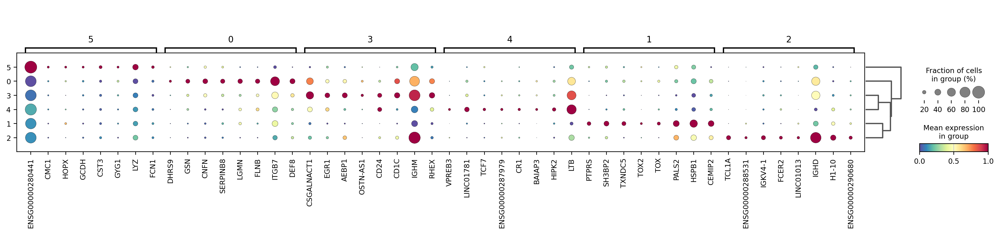

In [33]:
#cosg差异
cosg.cosg(adata, key_added=f'cosg_{groupby}', groupby=groupby,
          mu=10,n_genes_user=100,remove_lowly_expressed=True,
         )
df_tmp = pd.DataFrame(adata.uns[f'cosg_{groupby}']['names'])
df_tmp.to_csv(f"{obj_path}{celltype}/cosg_{groupby}.csv")
#cosg差异作图
df_tmp=pd.DataFrame(adata.uns[f'cosg_{groupby}']['names'][:8,]).T
df_tmp=df_tmp.reindex(adata.uns['dendrogram_'+groupby]['categories_ordered'])
marker_genes_list={idx: list(row.values) for idx, row in df_tmp.iterrows()}
marker_genes_list = {k: v for k, v in marker_genes_list.items() if not any(isinstance(x, float) for x in v)}
sc.pl.dotplot(adata, marker_genes_list,
             groupby=groupby,
             dendrogram=True,
             swap_axes=False,
             standard_scale='var',
             save=f'cosg_{groupby}',
             cmap='Spectral_r')

In [ ]:
fig, axs = plt.subplots(ncols=4, nrows=2, figsize=(16, 8))
sc.pl.umap(adata, color=groupby,legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,0],show=False)
sc.pl.umap(adata, color='CD27',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,1],show=False)
sc.pl.umap(adata, color='IGHM',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,2],show=False)
sc.pl.umap(adata, color='IGHD',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,3],show=False)

sc.pl.violin(adt,'IgM',groupby=groupby,show=False, ax=axs[1,0],size=0,layer='clr')
sc.pl.violin(adt,'IgD',groupby=groupby,show=False, ax=axs[1,1],size=0,layer='clr')
sc.pl.violin(adt,'CD27',groupby=groupby,show=False, ax=axs[1,2],size=0,layer='clr')
sc.pl.umap(adt, color='CD27',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[1,3],show=False)
plt.show()

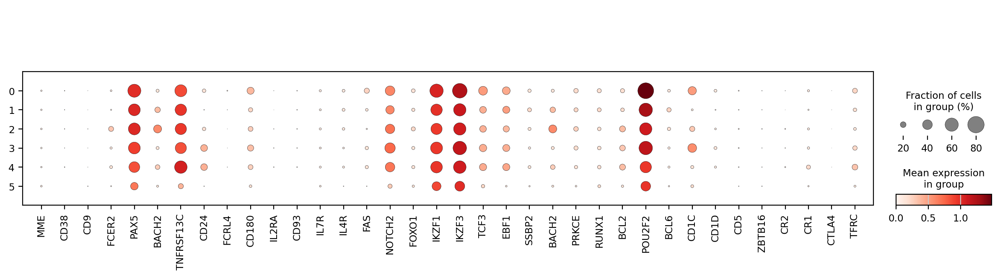

In [34]:
#Transitional MME, CD9, CD38, PAX5, and FCER2
sc.pl.dotplot(adata, ['MME','CD38','CD9','FCER2','PAX5','BACH2',
    'TNFRSF13C','CD24','FCRL4','CD180','IL2RA',
                      
                      'CD93','IL7R','IL4R','FAS','NOTCH2',
                      'FOXO1','IKZF1','IKZF3','TCF3',
                      'EBF1','SSBP2','BACH2','PRKCE','RUNX1','BCL2','POU2F2','BCL6',
                      'CD1C','CD1D','CD5','ZBTB16','CR2','CR1',
                     'CTLA4','TFRC'],
              standard_scale='obs',groupby=groupby)

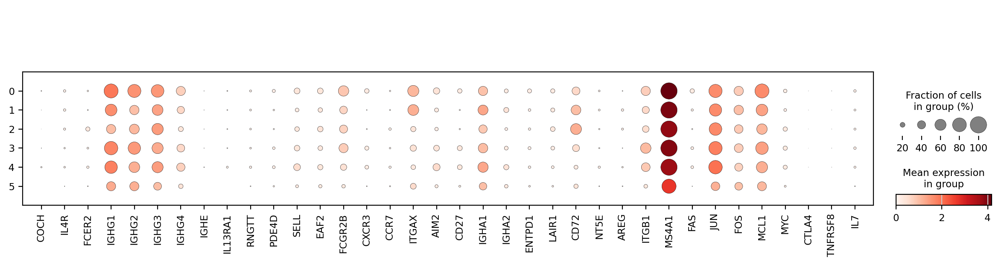

In [35]:
#Type 2 polarized memory B cell: IL4R, FCER2, COCH, IGHG1, IGHG4, and IGHE. IGHE
# early memory: CD27, AIM2 and class-switched isotype IgH (IGHA1, IGHA2 and IGHG1, IGHG2, IGHG3, and IGHG4). ‘Intermediate’
# Activated memory cell
sc.pl.dotplot(adata, ['COCH','IL4R','FCER2','IGHG1','IGHG2','IGHG3','IGHG4',
                      'IGHE','IL13RA1','RNGTT','PDE4D','SELL','EAF2','FCGR2B','CXCR3','CCR7',
                      'ITGAX',
                     'AIM2','CD27','IGHA1','IGHA2','ENTPD1','LAIR1','CD72',
#DEG                     
                     'NT5E','AREG','ITGB1','MS4A1','FAS','JUN','FOS','MCL1','MYC','CTLA4','TNFRSF8','IL7',],
              standard_scale='obs',groupby=groupby,)

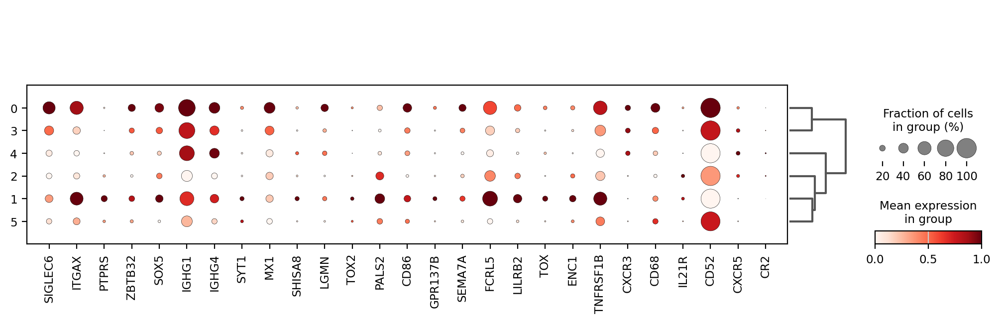

In [30]:
#atypical B
sc.pl.dotplot(adata, ['SIGLEC6','ITGAX','PTPRS','ZBTB32','SOX5','IGHG1','IGHG4',
                      'SYT1','MX1','SHISA8','LGMN','TOX2','PALS2','CD86','GPR137B','SEMA7A','FCRL5',
                     'LILRB2','TOX','ENC1','TNFRSF1B',
                      'CXCR3','CD68','IL21R','CD52','CXCR5','CR2'],
              standard_scale='var',groupby=groupby,dendrogram=True)

In [ ]:
sc.pl.violin(adata,'FCRL5',groupby=groupby,size=0)

In [11]:
adata.obs[groupby].value_counts()

L4_leiden_TOTALVI_0.8
1    14713
0    14516
3    14196
2    11697
4     8935
5       98
Name: count, dtype: int64

In [12]:
#也可以采用IgD IgM CD27来标
cell_dict = {'CD27- IgD- atypical memory B cells':['1',],#CD27- IgD- IgM-
             'Atypical naïve B cells':['2',],#IgD+ IgM+ CD27-

             'CD27+ IgD- atypical memory B cells':['4'],#IgD- IgM- CD27+ CD24+ VPREB3+ CR1+
            
             'CD27+ IgD+ atypical memory B cells':['0',#IgD+ IgM+ CD27+ AIM2+
                                           '3',],#IgD+ IgM+ CD27+ AIM2+
             'Doublet|Lowquality':['5',],#low UMI
            }

#In humans, the non-plasmablast B cell population contains CD21+CD27+ ‘typical’ memory B cells and two poorly understood subsets: 
# a population of CD21−CD27+ B cells, which contains a plasmablast-like subset, and a CD21−CD27− ‘atypical’ memory B cell population that contains a CD11c+ subset,
# which shares features with CD11chiCD21low age-associated B cells (ABCs) described in mice.


#Atypical memory cells had a high level of IgG while CD45RB+ classical memory groups had a mixture of IgA and IgG.

#https://www.nature.com/articles/s41467-024-50997-4
# CD11c+CD21loCXCR5-CD27-IgD+ Atypical (Atypical) naïve B cells[38] were visible and adjacent to 
# class-switched CD11c+CD21loCXCR5-CD27-IgD- atypical (Atypical) memory cells. The systematic analysis of human B cells across different tissues also supports this conclusion by showing that the ABC-like CD11c+CD21−CD27− B cells in humans are memory B cells98.
# CD45RB+ Activated B has higher expression of CD21, CXCR5, CD27, CD95, and was confirmed by direct comparison with CD45RB+CD27+ memory by its significantly 
# lower expression of CD21, CXCR5, CXCR4 and CD24 alongside significantly increased CD11c, CD39, CD71, CD38, CD95, Ki67 and CD19




# The CD95+ and CD19hi CD11chi clusters identified by scRNA-seq
# had closely matching gene expression and surface phenotypes to their
# respective mass cytometry clusters (Fig. 2, C to E). Namely, CD95+
# cells had high expression of CD95 (FAS), CD27, CD73 (NT5E), and
# CD39 (ENTPD1), as well as low expression of CD23 (FCER2), CD72,
# CD305 (LAIR1), and HLA-DR, relative to other subsets.
# !!!!!!!!!! CD19hi CD11chi
# cells had high expression of CD19, CD11c (ITGAX), CD20 (MS4A1),
# CD22, and CD183 (CXCR3), as well as low expression of CD21 (CR2),
# CD24, CD40, CD23 (FCER2), CD73 (NT5E), and CD197 (CCR7) compared
# with other subsets. These data provide additional validation of
# the MBC nomenclature established by Glass et al.


#Type 2 polarized memory B cell
# two clusters of that highly express markers associated with type 2 immunity. The unifying features were a high expression of  CD23 (FCER2) and  IL-4 (IL4R) and IL-13 (IL13RA1). 
# The two MBC2 clusters: IGHE+ MBC2s, the absence of IGHE and greater CD69 expression in the other (IGHE− MBC2s). When IGHE was not considered in the clustering analysis, these two populations coclustered,
# suggesting that they are transcriptionally related. 
# (i) IGHM+ IGHD+ CD27− cells, naïve B cells;
# (ii)  high expression of CD19, ITGAX (CD11c), and FCRL5, which are referred to as atypical B cells “CD19hi CD11chi”
# (iii) CD95+ FAS+ (CD95), ITGB1+ (CD29), NT5E+ (CD73) cells denoted as “CD95+”;
# (iv)  AREG, CDKN1A, and NFKB1, a phenotype similar to that reported by bulk RNA sequencing of citrullinated peptide-specific B cells

#https://www.cellsignal.cn/pathways/immune-cell-markers-human
#https://www.abcam.cn/primary-antibodies/b-cells-basic-immunophenotyping
#https://www.bdbiosciences.com/zh-cn/learn/research/immunology/b-cells#B-Cell-Immunophenotyping
#https://ashpublications.org/blood/article/114/25/5173/26511/An-in-vitro-model-of-differentiation-of-memory-B
#浆细胞、浆母细胞https://www.sohu.com/a/234622412_610701;
#https://zhuanlan.zhihu.com/p/56657003
#https://www.biocompare.com/Editorial-Articles/570578-A-Guide-to-B-Cell-Markers/
# https://www.cell.com/trends/immunology/fulltext/S1471-4906(22)00003-5#secst0040
# https://www.nature.com/articles/s41577-024-00991-0

# IgD的出现，意味着B细胞从原先耐受抗原的细胞，开始逐渐转变为可对抗原产生反应的B细胞了，
# 所以从T1、T2、T3开始IgD逐渐增高，到Naive达到高峰。当Naive刚变成Memory B时，IgD仍保留着，所以此时叫Unswitched（未转换），
# 只有Memory B的表面Ig从IgD转变为IgG、IgA或IgE时，才叫Switched Memory B
# ，就可以进一步向Plasmablast（浆母细胞）转换，开始大量分泌抗体。

In [13]:
check_dict_duplicates(cell_dict)

'无重复'

In [14]:
# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata.obs[groupby]).isin(cell_dict[i])
    adata.obs.loc[ind,'Celltype_L4_L5_Refine'] = i

In [15]:
(adata.obs['Celltype_L4_L5_Refine'].isna()).value_counts()

Celltype_L4_L5_Refine
False    64155
Name: count, dtype: int64

In [16]:
adata.obs['Celltype_L4_L5_Refine'].value_counts()

Celltype_L4_L5_Refine
CD27+ IgD+ atypical memory B cells    28712
CD27- IgD- atypical memory B cells    14713
Atypical naïve B cells                11697
CD27+ IgD- atypical memory B cells     8935
Doublet|Lowquality                       98
Name: count, dtype: int64

In [17]:
adata = adata[adata.obs['Celltype_L4_L5_Refine'] != "Doublet|Lowquality",:]

In [18]:
adata.obs['Celltype_L4_L5_Refine'].value_counts()

Celltype_L4_L5_Refine
CD27+ IgD+ atypical memory B cells    28712
CD27- IgD- atypical memory B cells    14713
Atypical naïve B cells                11697
CD27+ IgD- atypical memory B cells     8935
Name: count, dtype: int64

In [19]:
indices = adata.obs.loc[:,['Celltype_L1_L2','Celltype_L1_L2_Refine','Celltype_L2_L3_Refine','Celltype_L3_L4_Refine','Celltype_L4_L5_Refine',groupby,'receptor_type','receptor_type_BCR']]
indices['UMAP_1'] = adata.obsm['X_umap'][:, 0].copy()
indices['UMAP_2'] = adata.obsm['X_umap'][:, 1].copy()
indices.rename(columns={groupby: 'leiden_cluster'}, inplace=True) #Save the cluster categorical, check the relationship between clusters and clinical to avoid missing someone.
indices['leiden_cluster'] = celltype + " c" + indices['leiden_cluster'].astype(str)
os.makedirs(f'{finnal_path}/{celltype}', exist_ok=True)
indices.to_csv(f"{finnal_path}/{celltype}/Finnal_indices_{celltype}.csv")
indices.head()

,Celltype_L1_L2,Celltype_L1_L2_Refine,Celltype_L2_L3_Refine,Celltype_L3_L4_Refine,Celltype_L4_L5_Refine,leiden_cluster,receptor_type,receptor_type_BCR,UMAP_1,UMAP_2
D0589_Rep1_ACTATGCA_CGACTGGA_ACGTATCA,B|Plasma,Atypical memory B,Atypical memory B,Atypical memory B,CD27+ IgD+ atypical memory B cells,AtypicalB c0,NaN,BCR,-0.992545,3.987298
D0589_Rep1_CACTTCGA_AGTACAAG_GCCACATA,B|Plasma,Atypical memory B,Atypical memory B,Atypical memory B,CD27+ IgD+ atypical memory B cells,AtypicalB c0,NaN,BCR,-1.828322,3.167918
D0589_Rep1_GATAGACA_CTCAATGA_CTGAGCCA,B|Plasma,Memory B,Atypical memory B,Atypical memory B,CD27+ IgD+ atypical memory B cells,AtypicalB c0,NaN,BCR,-1.076792,3.095645
D0589_Rep1_AAGAGATC_AGTGGTCA_GCCACATA,B|Plasma,Memory B,Atypical memory B,Atypical memory B,CD27+ IgD+ atypical memory B cells,AtypicalB c0,NaN,BCR,-1.343839,4.260731
D0589_Rep1_CGCATACA_GGAGAACA_CCTCTATC,B|Plasma,Atypical memory B,Atypical memory B,Atypical memory B,CD27+ IgD+ atypical memory B cells,AtypicalB c0,NaN,BCR,-1.285628,3.138626


# 2. 定 CD4 Treg Cell Refine

In [541]:
celltype="TregCD4"
R_data_path = f"{obj_path}{celltype}"
sc.settings.figdir=f"{obj_path}{celltype}"

In [542]:
adata,adt,leiden_data = get_norm_annotation_data(celltype)

In [ ]:
sc.pl.umap(adata, color=['Celltype_L1_L2','Celltype_L1_L2_Refine','Celltype_L2_L3_Refine','Celltype_L3_L4_Refine'],
           frameon=False,
           legend_fontsize=4, legend_fontoutline=2,
           size=4)

In [543]:
adata.obs['Celltype_L3_L4_Refine'].value_counts()

Celltype_L3_L4_Refine
Treg CD4+           368980
Tem CD4+ T(Treg)    333632
Treg(Help)           85745
Name: count, dtype: int64

In [544]:
adata.obs.groupby(['L4_leiden_TOTALVI_0.3', 'Celltype_L3_L4_Refine']).size()

L4_leiden_TOTALVI_0.3  Celltype_L3_L4_Refine
0                      Tem CD4+ T(Treg)         289595
                       Treg CD4+                 89318
                       Treg(Help)                17725
1                      Tem CD4+ T(Treg)          20784
                       Treg CD4+                149480
                       Treg(Help)                55032
2                      Tem CD4+ T(Treg)          12622
                       Treg CD4+                  1131
                       Treg(Help)                  648
3                      Tem CD4+ T(Treg)           9699
                       Treg CD4+                127954
                       Treg(Help)                12068
4                      Tem CD4+ T(Treg)            932
                       Treg CD4+                  1097
                       Treg(Help)                  272
dtype: int64

In [545]:
groupby = "L4_leiden_TOTALVI_1.5"

In [468]:
xlsx = pd.ExcelWriter(f"{obj_path}{celltype}/{groupby}_freq_table.xlsx")
for group in ['SampleID', 'DonorID','scDblFinder.class',
              'Immune_All_Low', 'Adult_Human_Blood', 'Adult_Human_Bone_marrow',
              'AIFI_L2', 'AIFI_L3', 'predicted.celltype.l2',
              
              ]:
    freq_table_multi = adata.obs.groupby([groupby, group]).size()
    pd.DataFrame(freq_table_multi).to_excel(xlsx,sheet_name=group)
xlsx.close()

In [ ]:
#数据簇间信息比较
fig, axs = plt.subplots(5, 2, figsize=(18, 12),constrained_layout=True)
plt.subplots_adjust(hspace=1,wspace=1)
sc.pl.violin(adata, keys='nCount_RNA', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[0,0], show=False)
sc.pl.violin(adata, keys='nFeature_RNA', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[0,1], show=False)
sc.pl.violin(adata, keys='log10GenesPerUMI', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[1,0], show=False)
sc.pl.violin(adata, keys='percent_top50', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[1,1], show=False)

sc.pl.violin(adata, keys='percent_apop', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[2,0], show=False)
sc.pl.violin(adata, keys='percent_ribo', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[2,1], show=False)
sc.pl.violin(adata, keys='percent_ieg', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[3,0], show=False)
sc.pl.violin(adata, keys='percent_oxphos', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[3,1], show=False)
sc.pl.violin(adata, keys='percent_hemo', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[4,0], show=False)
sc.pl.violin(adata, keys='G2M.Score', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[4,1], show=False)

fig.tight_layout()
plt.savefig(f'{obj_path}{celltype}/{groupby}_TOTALVI_L3_metadata.png')

In [470]:
sc.tl.dendrogram(adata,groupby=groupby,use_rep='X_TOTALVI')
sc.tl.dendrogram(adt,groupby=groupby,use_rep='X_TOTALVI')

In [ ]:
#cosg差异
cosg.cosg(adata, key_added=f'cosg_{groupby}', groupby=groupby,
          mu=10,n_genes_user=100,remove_lowly_expressed=True,
         )
df_tmp = pd.DataFrame(adata.uns[f'cosg_{groupby}']['names'])
df_tmp.to_csv(f"{obj_path}{celltype}/cosg_{groupby}.csv")
#cosg差异作图
df_tmp=pd.DataFrame(adata.uns[f'cosg_{groupby}']['names'][:8,]).T
df_tmp=df_tmp.reindex(adata.uns['dendrogram_'+groupby]['categories_ordered'])
marker_genes_list={idx: list(row.values) for idx, row in df_tmp.iterrows()}
marker_genes_list = {k: v for k, v in marker_genes_list.items() if not any(isinstance(x, float) for x in v)}
sc.pl.dotplot(adata, marker_genes_list,
             groupby=groupby,
             dendrogram=True,
             swap_axes=False,
             standard_scale='var',
             save=f'cosg_{groupby}',
             cmap='Spectral_r')

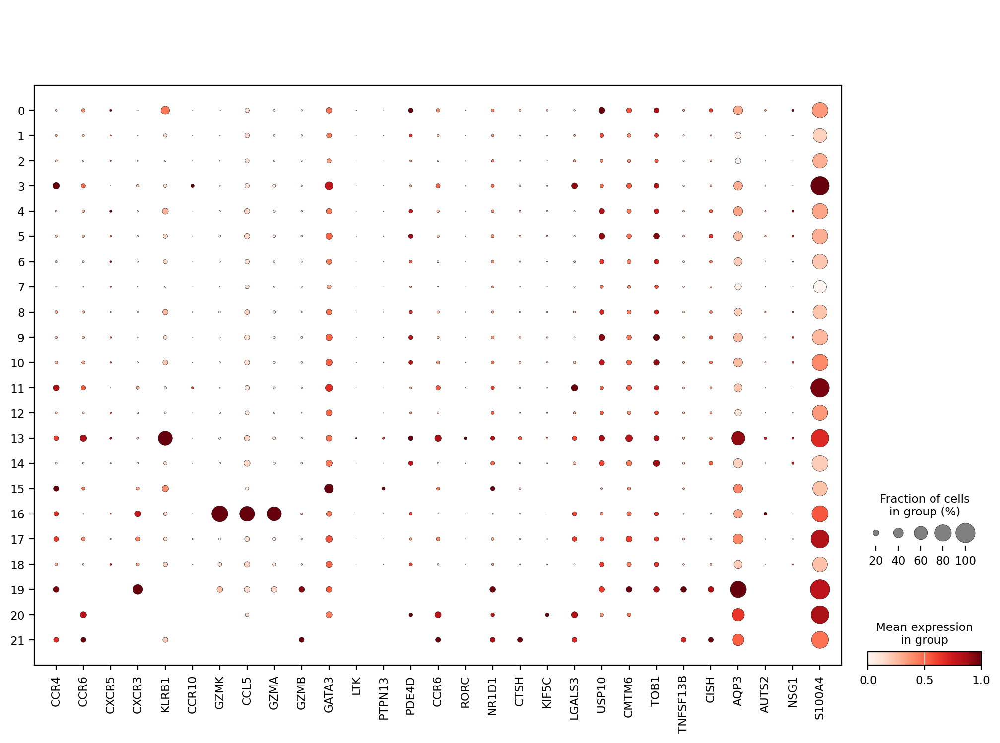

In [472]:
#Th17
sc.pl.dotplot(adata, ['CCR4','CCR6','CXCR5','CXCR3','KLRB1','CCR10','GZMK','CCL5','GZMA','GZMB','GATA3',
                      'LTK','PTPN13','PDE4D','CCR6','RORC','NR1D1','CTSH','KIF5C','LGALS3','USP10','CMTM6','TOB1',
                     'TNFSF13B','CISH','AQP3','AUTS2','NSG1','S100A4'],
              standard_scale='var',groupby=groupby)

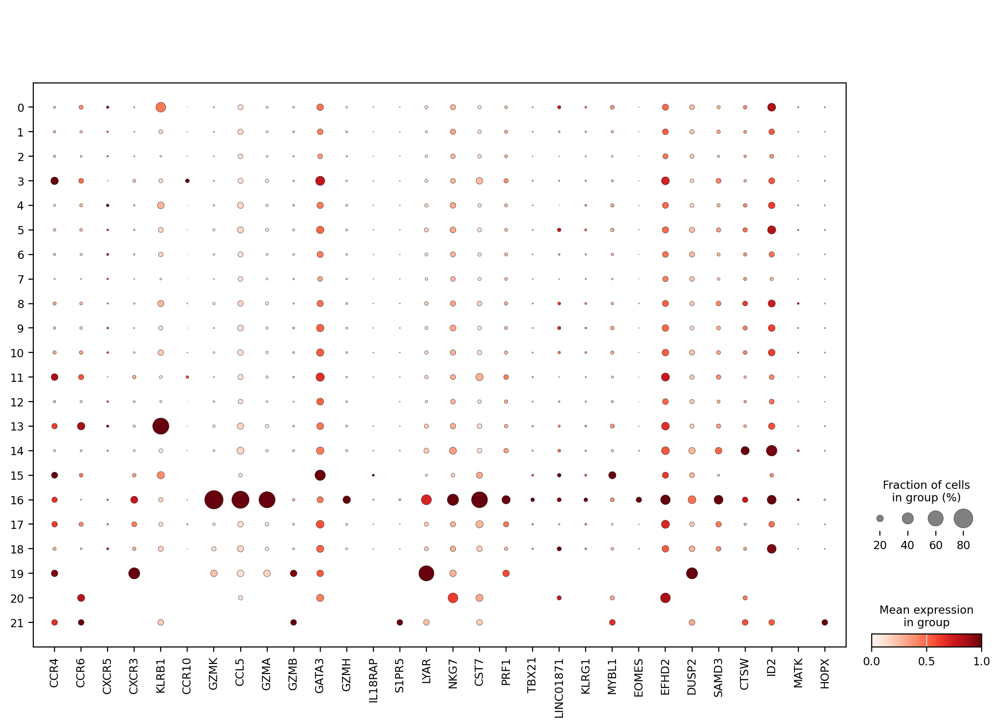

In [473]:
#Th1/Th17
sc.pl.dotplot(adata, ['CCR4','CCR6','CXCR5','CXCR3','KLRB1','CCR10','GZMK','CCL5','GZMA','GZMB','GATA3',
                      'GZMH','IL18RAP','S1PR5','LYAR','NKG7','CST7','PRF1','TBX21','LINC01871','KLRG1','MYBL1','EOMES',
                     'EFHD2','DUSP2','SAMD3','CTSW','ID2','MATK','HOPX',],
              standard_scale='var',groupby=groupby)

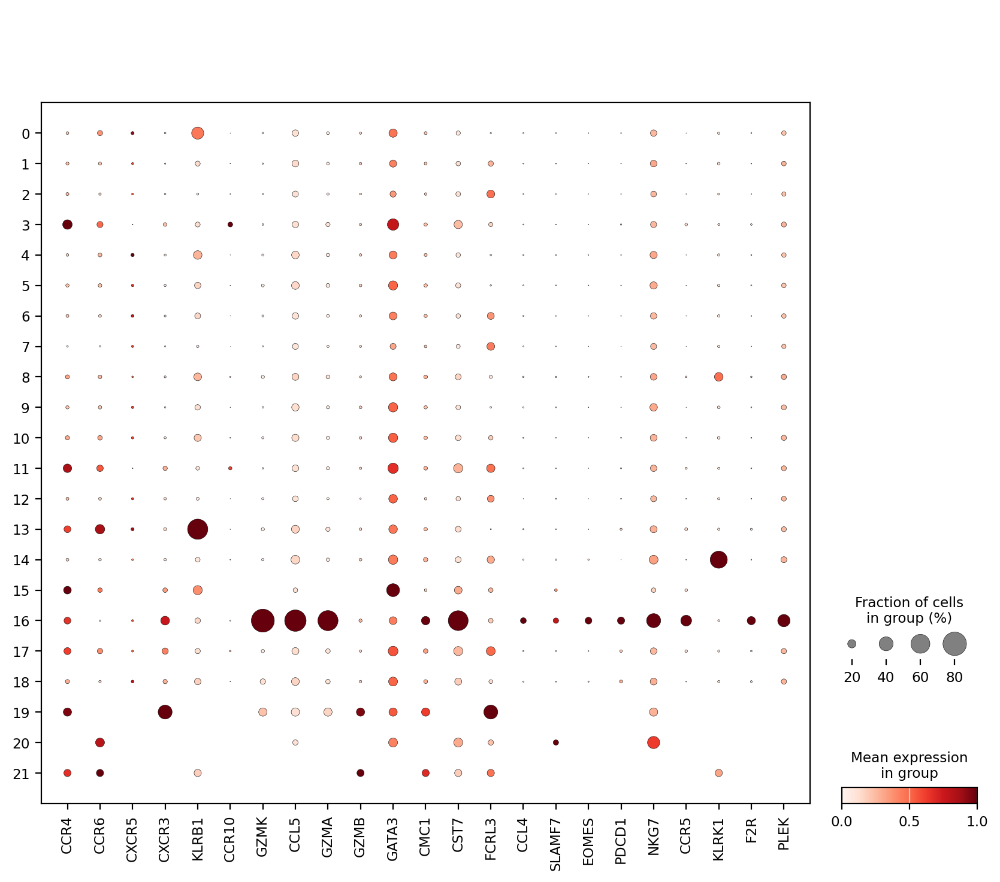

In [474]:
#Th1
sc.pl.dotplot(adata, ['CCR4','CCR6','CXCR5','CXCR3','KLRB1','CCR10','GZMK','CCL5','GZMA','GZMB','GATA3',
                      'CMC1','CST7','FCRL3','CCL4','SLAMF7','EOMES','PDCD1','NKG7','CCR5','KLRK1','F2R','PLEK'],
              standard_scale='var',groupby=groupby)

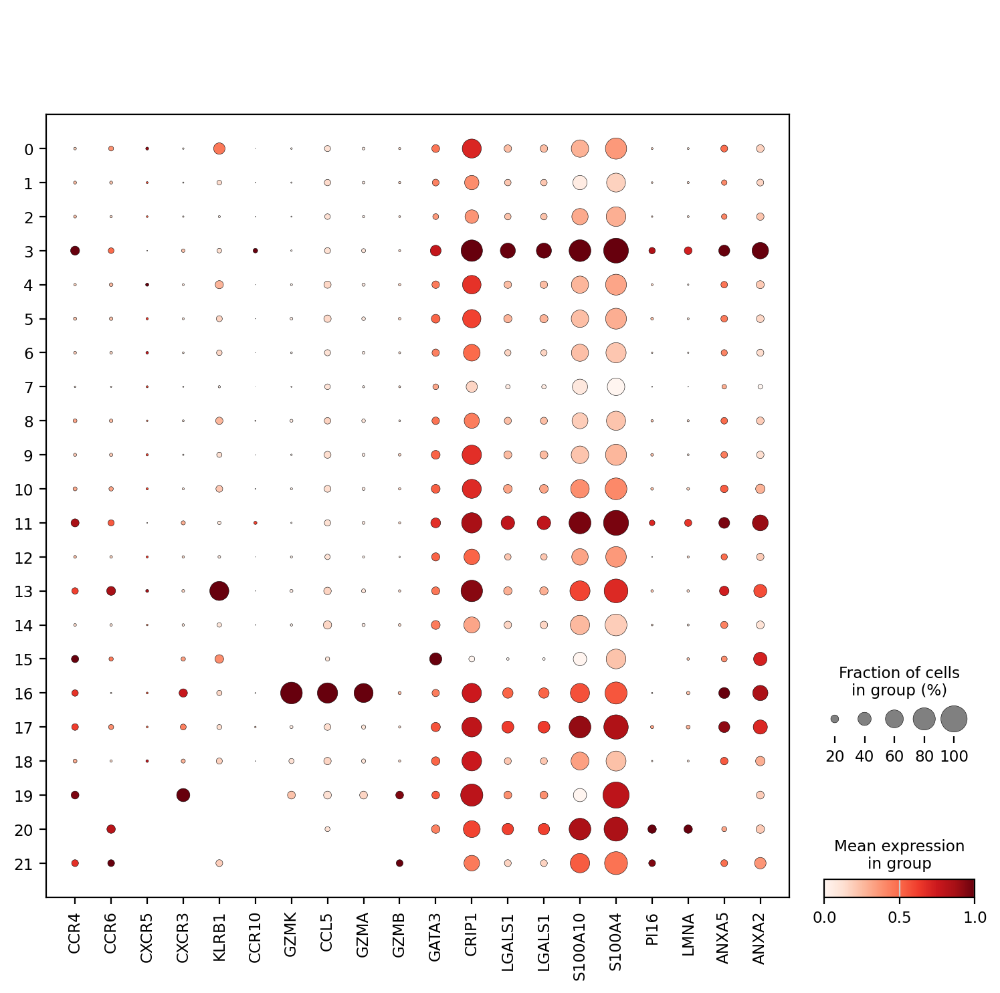

In [475]:
#Th22
sc.pl.dotplot(adata, ['CCR4','CCR6','CXCR5','CXCR3','KLRB1','CCR10','GZMK','CCL5','GZMA','GZMB','GATA3',
                      'CRIP1','LGALS1','LGALS1','S100A10','S100A4','PI16','LMNA','ANXA5','ANXA2'],
              standard_scale='var',groupby=groupby)

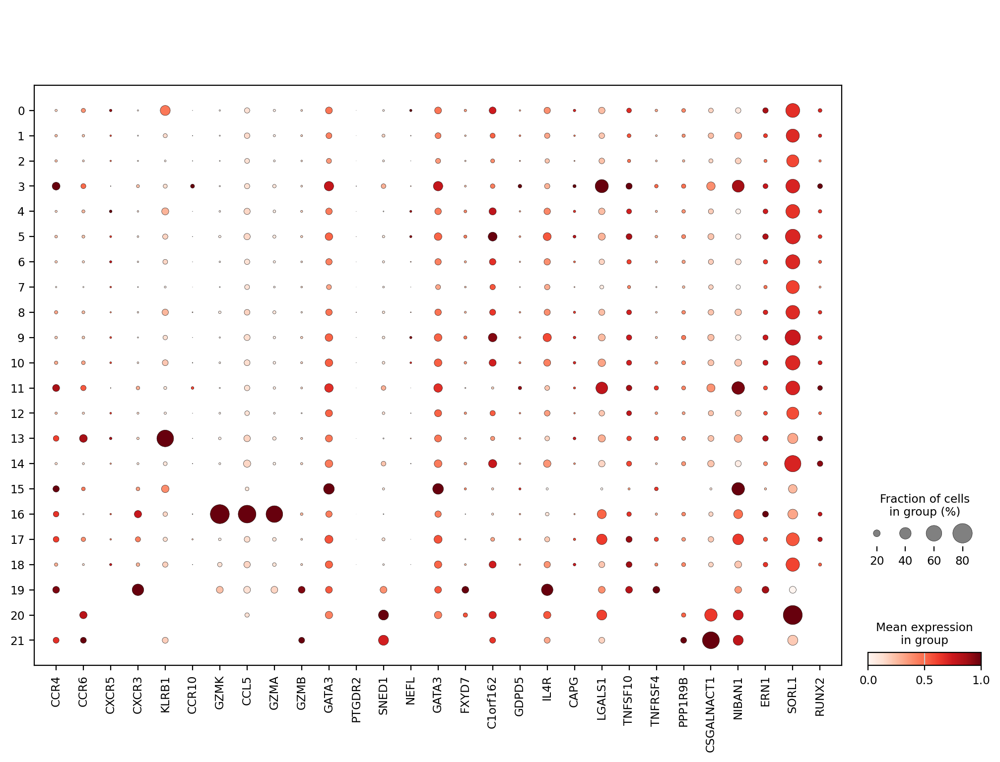

In [476]:
#Th2
sc.pl.dotplot(adata, ['CCR4','CCR6','CXCR5','CXCR3','KLRB1','CCR10','GZMK','CCL5','GZMA','GZMB','GATA3',
                      'PTGDR2','SNED1','NEFL','GATA3','FXYD7','C1orf162','GDPD5','IL4R','CAPG',
                     'LGALS1','TNFSF10','TNFRSF4','PPP1R9B','CSGALNACT1','NIBAN1','ERN1','SORL1','RUNX2'],
              standard_scale='var',groupby=groupby)

In [ ]:
fig, axs = plt.subplots(ncols=4, nrows=2, figsize=(16, 8))
sc.pl.umap(adata, color=groupby,legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,0],show=False,layer='denoised_protein')
sc.pl.umap(adata, color='GZMK',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,1],show=False)
sc.pl.umap(adata, color='CCR4',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,2],show=False)
sc.pl.umap(adata, color='CXCR5',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,3],show=False)
sc.pl.umap(adata, color='CTLA4',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[1,0],show=False)
sc.pl.umap(adata, color='KLRB1',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[1,1],show=False)
sc.pl.umap(adata, color='CXCR3',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[1,2],show=False)
sc.pl.umap(adata, color='CCR6',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[1,3],show=False)
plt.show()

In [ ]:
fig, axs = plt.subplots(ncols=4, nrows=2, figsize=(16, 8))
sc.pl.umap(adata, color=groupby,legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,0],show=False)
sc.pl.umap(adata, color='IKZF2',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,1],show=False)
sc.pl.umap(adata, color='CTLA4',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,2],show=False)
sc.pl.umap(adata, color='FOXP3',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,3],show=False)
sc.pl.umap(adata, color='CTLA4',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[1,0],show=False)
sc.pl.umap(adata, color='PDCD1',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[1,1],show=False)
sc.pl.umap(adata, color='TIGIT',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[1,2],show=False)
sc.pl.umap(adata, color='IL2RA',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[1,3],show=False)
plt.show()

In [ ]:
sc.pl.umap(adt, color='CD127',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',layer='dsb')

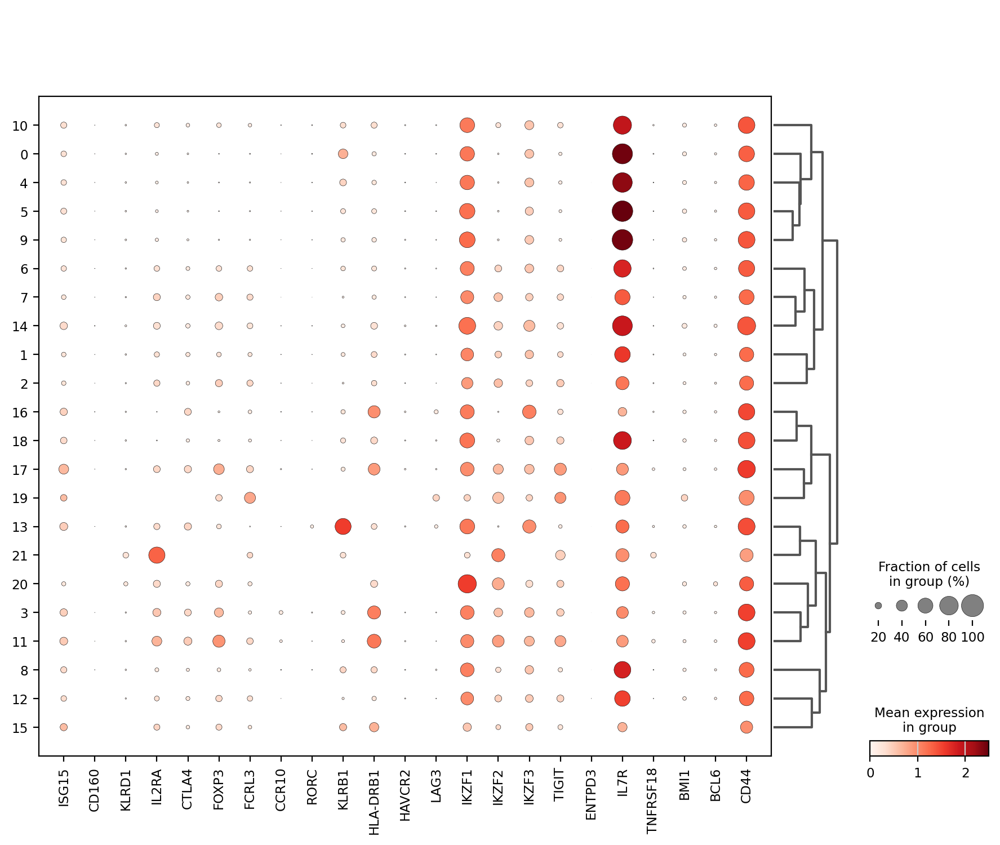

In [480]:
sc.pl.dotplot(adata, ['ISG15','CD160','KLRD1','IL2RA','CTLA4','FOXP3','FCRL3','CCR10','RORC','KLRB1','HLA-DRB1',
                     'HAVCR2','LAG3','IKZF1','IKZF2','IKZF3','TIGIT','ENTPD3','IL7R','TNFRSF18','BMI1','BCL6','CD44'],
              standard_scale='obs',groupby=groupby,dendrogram=True)

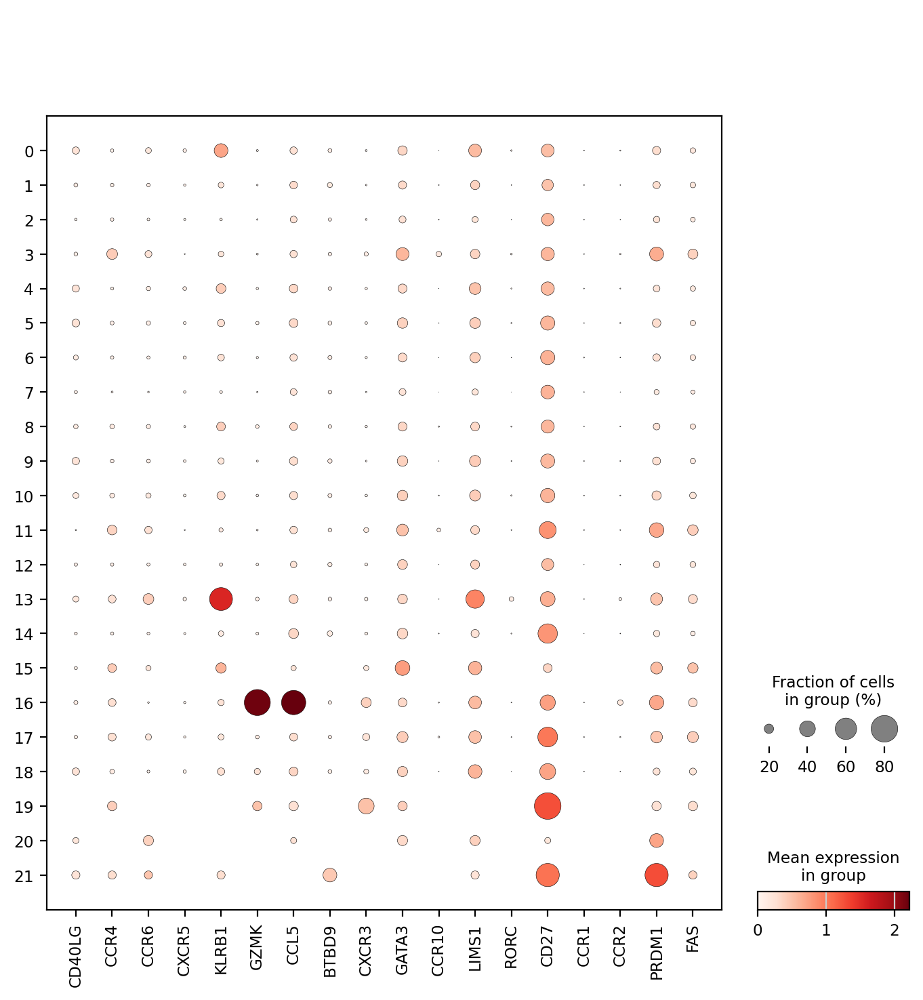

In [481]:
sc.pl.dotplot(adata, ['CD40LG','CCR4','CCR6','CXCR5','KLRB1','GZMK','CCL5','BTBD9','CXCR3',
                      'GATA3','CCR10','LIMS1','RORC','CD27','CCR1','CCR2','PRDM1',"FAS"],
              standard_scale='obs',groupby=groupby)

In [ ]:
sc.pl.violin(adata,["IKZF2",'IKZF3','FOXP3'],groupby='L4_leiden_TOTALVI_1.5',size=0)

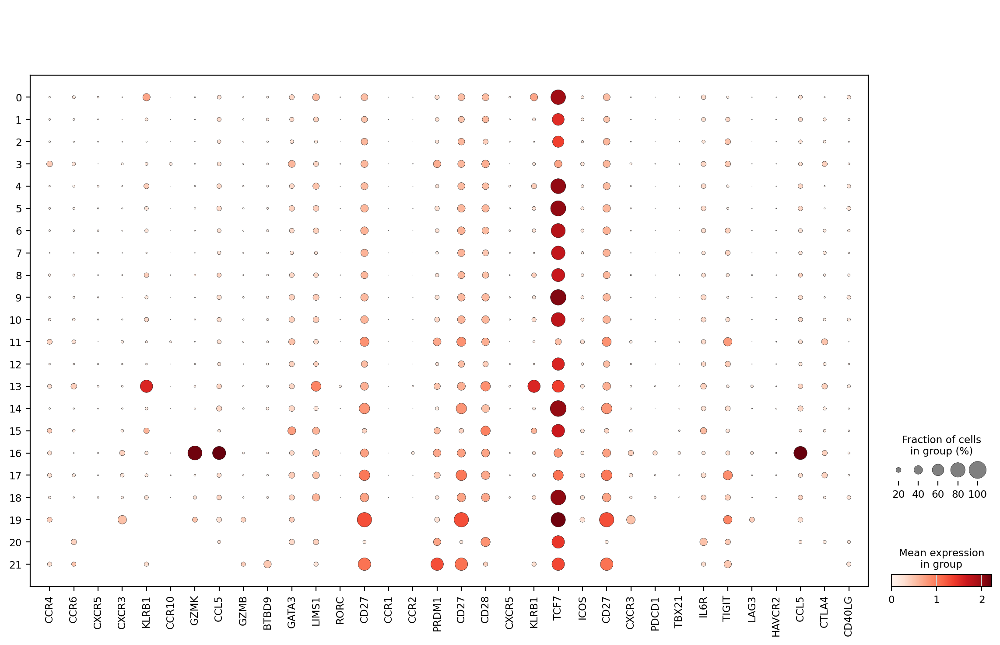

In [483]:
sc.pl.dotplot(adata, ['CCR4','CCR6','CXCR5','CXCR3','KLRB1','CCR10','GZMK','CCL5','GZMB','BTBD9','GATA3',
                      'LIMS1','RORC','CD27','CCR1','CCR2','PRDM1','CD27','CD28','CXCR5','KLRB1',
                      'TCF7','ICOS','CD27','CXCR3','PDCD1','TBX21','IL6R','TIGIT','LAG3','HAVCR2',
                      'CCL5','CTLA4','CD40LG'],
              standard_scale='obs',groupby=groupby)

In [ ]:
adata.obs['cluster_dummy']="NOT"
adata.obs.loc[adata.obs['L4_leiden_TOTALVI_1.5']=="18",'cluster_dummy'] = "YES"
sc.pl.umap(adata, color='cluster_dummy')

In [546]:
adata.obs['L4_leiden_TOTALVI_1.5'].value_counts()

L4_leiden_TOTALVI_1.5
2     97182
11    95152
13    84070
5     74150
7     72110
3     65156
4     64554
9     53875
18    42830
0     34295
10    31618
17    25208
6     20804
1     15444
16     6247
8      4440
14      821
12      359
15       22
20        9
21        6
19        5
Name: count, dtype: int64

In [547]:
#Naïve CD4+ T 需要CD45RA+ CCR7=CD197hi CD62Lhi
# effector memory T cells(TEM, CD45RA-/CCR7-)
# TEMRA cells, which are T cells that re-express CD45RA(CD45RA+/CCR7-)

#IRF4- TGFB1+ CXCR4lo
cell_dict = {
            'Treg Naive CD4+ T':['2','7'],#CD45RA+ FOXP3+
    'Treg memory CD4+ T':['1','3','6','11','12','13','15','17',
                          ],#
    'Th1':['16'],#CD127-
    'T help Memory(fromTreg)':['0','4','5','9','18'],#CD127 HLA-DR-
    'Doublet|Lowquality':['10',
                          '14',#双胞率高
                          '19',#CSF3R
                          '20','21'],#CD4和8不一致

    'Treg CD8+ T':['8'],
            }

#Single-cell atlas of healthy human blood unveils agerelated loss of NKG2C+GZMB–CD8+ memory T cells and accumulation of type 2 memory T cells

#naïve (CD45RApos), memory (CD45RAnegCD73neg), TR1‐like (CD73pos), and activated (HLA‐DRposCD39pos). 

In [548]:
check_dict_duplicates(cell_dict)

'无重复'

In [549]:
# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata.obs[groupby]).isin(cell_dict[i])
    adata.obs.loc[ind,'Celltype_L4_L5_Refine'] = i

In [550]:
(adata.obs['Celltype_L4_L5_Refine'].isna()).value_counts()

Celltype_L4_L5_Refine
False    788357
Name: count, dtype: int64

In [551]:
adata.obs['Celltype_L4_L5_Refine'].value_counts()

Celltype_L4_L5_Refine
Treg memory CD4+ T         306215
T help Memory(fromTreg)    269704
Treg Naive CD4+ T          169292
Doublet|Lowquality          32459
Th1                          6247
Treg CD8+ T                  4440
Name: count, dtype: int64

In [552]:
adata = adata[adata.obs['L4_leiden_TOTALVI_1'] != "9",:]#low UMI

In [553]:
adata = adata[adata.obs['Celltype_L4_L5_Refine'] != "Doublet|Lowquality",:]

In [554]:
indices = adata.obs.loc[:,['Celltype_L1_L2','Celltype_L1_L2_Refine','Celltype_L2_L3_Refine','Celltype_L3_L4_Refine','Celltype_L4_L5_Refine','receptor_type','receptor_type_BCR']]
indices.to_csv(f"{obj_path}/{celltype}/R4_refine_indices_{celltype}.csv")

In [555]:
adata.obs['Celltype_L4_L5_Refine'].value_counts()

Celltype_L4_L5_Refine
Treg memory CD4+ T         303528
T help Memory(fromTreg)    269636
Treg Naive CD4+ T          169279
Th1                          6244
Treg CD8+ T                  4440
Name: count, dtype: int64

# 3. 定 CD8 Treg Cell Refine

In [143]:
celltype="TregCD8"
R_data_path = f"{obj_path}{celltype}"
sc.settings.figdir=f"{obj_path}{celltype}"

In [144]:
adata,adt,leiden_data = get_norm_annotation_data(celltype)

In [ ]:
sc.pl.umap(adata, color=['Celltype_L1_L2','Celltype_L1_L2_Refine','Celltype_L2_L3_Refine','receptor_type','receptor_type_BCR'],
           frameon=False,
           legend_fontsize=4, legend_fontoutline=2,
           size=4)

In [145]:
groupby = "L4_leiden_TOTALVI_1"

In [329]:
xlsx = pd.ExcelWriter(f"{obj_path}{celltype}/{groupby}_freq_table.xlsx")
for group in ['SampleID', 'DonorID','scDblFinder.class',
              'Immune_All_Low', 'Adult_Human_Blood', 'Adult_Human_Bone_marrow',
              'AIFI_L2', 'AIFI_L3', 'predicted.celltype.l2',
              
              ]:
    freq_table_multi = adata.obs.groupby([groupby, group]).size()
    pd.DataFrame(freq_table_multi).to_excel(xlsx,sheet_name=group)
xlsx.close()

In [ ]:
#数据簇间信息比较
fig, axs = plt.subplots(5, 2, figsize=(18, 12),constrained_layout=True)
plt.subplots_adjust(hspace=1,wspace=1)
sc.pl.violin(adata, keys='nCount_RNA', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[0,0], show=False)
sc.pl.violin(adata, keys='nFeature_RNA', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[0,1], show=False)
sc.pl.violin(adata, keys='log10GenesPerUMI', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[1,0], show=False)
sc.pl.violin(adata, keys='percent_top50', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[1,1], show=False)

sc.pl.violin(adata, keys='percent_apop', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[2,0], show=False)
sc.pl.violin(adata, keys='percent_ribo', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[2,1], show=False)
sc.pl.violin(adata, keys='percent_ieg', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[3,0], show=False)
sc.pl.violin(adata, keys='percent_oxphos', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[3,1], show=False)
sc.pl.violin(adata, keys='percent_hemo', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[4,0], show=False)
sc.pl.violin(adata, keys='G2M.Score', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[4,1], show=False)

fig.tight_layout()
plt.savefig(f'{obj_path}{celltype}/{groupby}_TOTALVI_L3_metadata.png')

In [331]:
sc.tl.dendrogram(adata,groupby=groupby,use_rep='X_TOTALVI')
sc.tl.dendrogram(adt,groupby=groupby,use_rep='X_TOTALVI')

In [ ]:
#cosg差异
cosg.cosg(adata, key_added=f'cosg_{groupby}', groupby=groupby,
          mu=10,n_genes_user=100,remove_lowly_expressed=True,
         )
df_tmp = pd.DataFrame(adata.uns[f'cosg_{groupby}']['names'])
df_tmp.to_csv(f"{obj_path}{celltype}/cosg_{groupby}.csv")
#cosg差异作图
df_tmp=pd.DataFrame(adata.uns[f'cosg_{groupby}']['names'][:8,]).T
df_tmp=df_tmp.reindex(adata.uns['dendrogram_'+groupby]['categories_ordered'])
marker_genes_list={idx: list(row.values) for idx, row in df_tmp.iterrows()}
marker_genes_list = {k: v for k, v in marker_genes_list.items() if not any(isinstance(x, float) for x in v)}
sc.pl.dotplot(adata, marker_genes_list,
             groupby=groupby,
             dendrogram=True,
             swap_axes=False,
             standard_scale='var',
             save=f'cosg_{groupby}',
             cmap='Spectral_r')

In [ ]:
fig, axs = plt.subplots(ncols=4, nrows=2, figsize=(16, 8))
sc.pl.umap(adata, color=groupby,legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,0],show=False,layer='denoised_protein')
sc.pl.umap(adt, color='CD45RA',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,1],show=False)
sc.pl.umap(adata, color='CTLA4',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,2],show=False)
sc.pl.umap(adata, color='FOXP3',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,3],show=False)
sc.pl.umap(adata, color='CTLA4',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[1,0],show=False)
sc.pl.umap(adata, color='PDCD1',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[1,1],show=False)
sc.pl.umap(adata, color='TIGIT',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[1,2],show=False)
sc.pl.umap(adata, color='IL2RA',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[1,3],show=False)
plt.show()

In [ ]:
sc.pl.umap(adata, color='MKI67',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data')

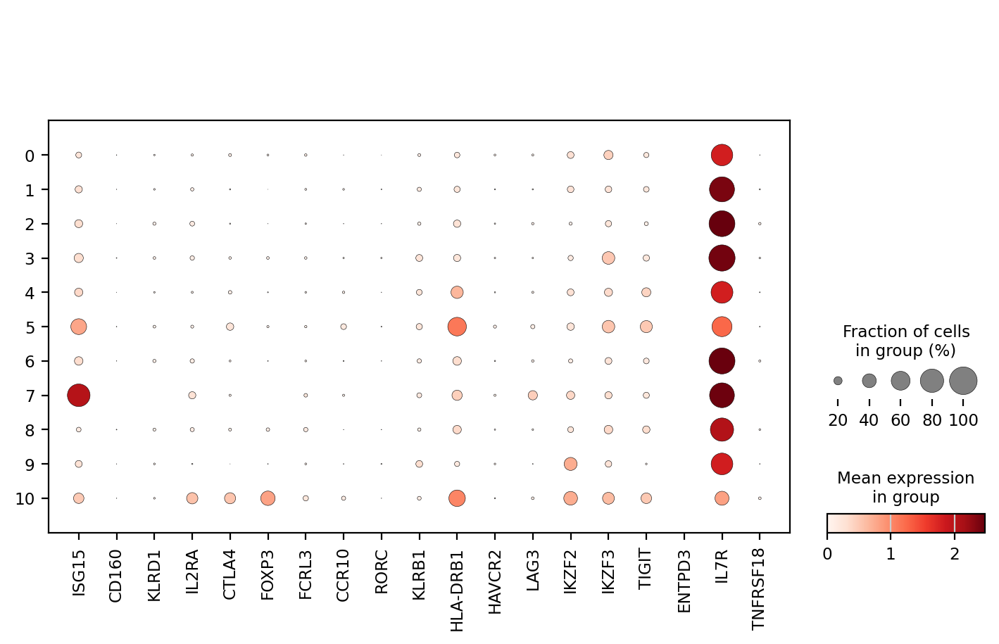

In [335]:
sc.pl.dotplot(adata, ['ISG15','CD160','KLRD1','IL2RA','CTLA4','FOXP3','FCRL3','CCR10','RORC','KLRB1','HLA-DRB1',
                     'HAVCR2','LAG3','IKZF2','IKZF3','TIGIT','ENTPD3','IL7R','TNFRSF18'],
              standard_scale='obs',groupby=groupby)

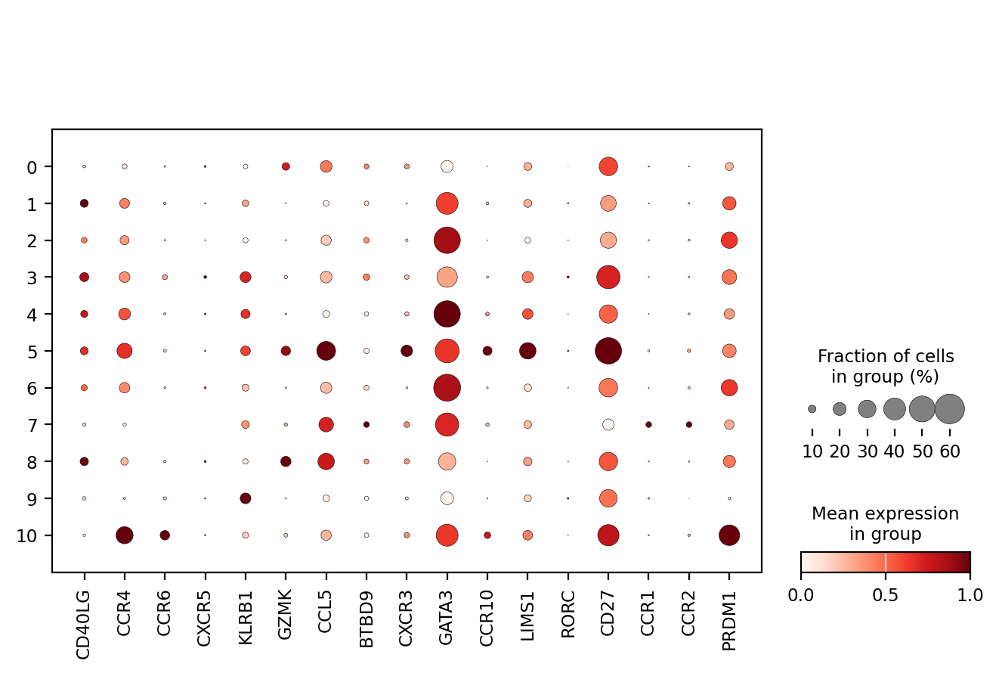

In [336]:
sc.pl.dotplot(adata, ['CD40LG','CCR4','CCR6','CXCR5','KLRB1','GZMK','CCL5','BTBD9','CXCR3',
                      'GATA3','CCR10','LIMS1','RORC','CD27','CCR1','CCR2','PRDM1'],
              standard_scale='var',groupby=groupby)

In [ ]:
sc.pl.violin(adata,["IKZF2",'IKZF3','FOXP3'],groupby='L4_leiden_TOTALVI_0.3')

In [133]:
adata.obs[groupby].value_counts()

L4_leiden_TOTALVI_1
2     2382
4     1912
10    1824
0     1300
3     1143
6     1011
8      853
1      851
5      663
9      626
7       30
Name: count, dtype: int64

In [146]:
#Naïve CD4+ T 需要CD45RA+ CCR7=CD197hi CD62Lhi
# effector memory T cells(TEM, CD45RA-/CCR7-)
# TEMRA cells, which are T cells that re-express CD45RA(CD45RA+/CCR7-)

#IRF4- TGFB1+ CXCR4lo 
cell_dict = {
    'Treg CD8+ T':['10',],#
    'Vδ1 T':['9'],
    'Tcm':['1','2','4','7',],#CD45RA- CCR7+

    'Proliferative memory CD8+ T':['5',],
    "Doublet|Lowquality":['3','8',#CD4+CD8+
                          '0',#可能的Naive CD8 Treg, 不好判断
                           '6',],#ADT
            }
 
            


#Single-cell atlas of healthy human blood unveils agerelated loss of NKG2C+GZMB–CD8+ memory T cells and accumulation of type 2 memory T cells

#naïve (CD45RApos), memory (CD45RAnegCD73neg), TR1‐like (CD73pos), and activated (HLA‐DRposCD39pos). 

In [147]:
check_dict_duplicates(cell_dict)

'无重复'

In [148]:
# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata.obs[groupby]).isin(cell_dict[i])
    adata.obs.loc[ind,'Celltype_L4_L5_Refine'] = i

In [149]:
(adata.obs['Celltype_L4_L5_Refine'].isna()).value_counts()

Celltype_L4_L5_Refine
False    12595
Name: count, dtype: int64

In [150]:
adata.obs['Celltype_L4_L5_Refine'].value_counts()

Celltype_L4_L5_Refine
Tcm                            5175
Doublet|Lowquality             4307
Treg CD8+ T                    1824
Proliferative memory CD8+ T     663
Vδ1 T                           626
Name: count, dtype: int64

In [151]:
adata.obs.loc[(adata.obs['Celltype_L4_L5_Refine']=='Vδ1 T') & (adata.obs['receptor_type']=='TCR'),'Celltype_L4_L5_Refine']='Doublet|Lowquality'

In [152]:
adata.obs['Celltype_L4_L5_Refine'].value_counts()

Celltype_L4_L5_Refine
Tcm                            5175
Doublet|Lowquality             4493
Treg CD8+ T                    1824
Proliferative memory CD8+ T     663
Vδ1 T                           440
Name: count, dtype: int64

In [153]:
adata = adata[adata.obs['Celltype_L4_L5_Refine'] != "Doublet|Lowquality",:]

In [154]:
adata.obs['Celltype_L4_L5_Refine'].value_counts()

Celltype_L4_L5_Refine
Tcm                            5175
Treg CD8+ T                    1824
Proliferative memory CD8+ T     663
Vδ1 T                           440
Name: count, dtype: int64

In [155]:
indices = adata.obs.loc[:,['Celltype_L1_L2','Celltype_L1_L2_Refine','Celltype_L2_L3_Refine','Celltype_L3_L4_Refine','Celltype_L4_L5_Refine','receptor_type','receptor_type_BCR']]
indices.to_csv(f"{obj_path}/{celltype}/R4_refine_indices_{celltype}.csv")

# 4. 定 Helper memory CD4+ T Cell Refine

In [524]:
celltype="CD4_helper_memory"
R_data_path = f"{obj_path}{celltype}"
sc.settings.figdir=f"{obj_path}{celltype}"

In [525]:
adata,adt,leiden_data = get_norm_annotation_data(celltype)

In [ ]:
sc.pl.umap(adata, color=['Celltype_L1_L2_Refine','Celltype_L2_L3_Refine','Celltype_L3_L4_Refine'],
           frameon=False,
           legend_fontsize=4, legend_fontoutline=2,
           size=4,
           )

In [526]:
adata.obs['Celltype_L3_L4_Refine'].value_counts()

Celltype_L3_L4_Refine
Tfh         1044618
Th1/Th17     328042
Th22         306766
Th17         224083
Th1           81038
Th2           77614
Name: count, dtype: int64

In [527]:
adata.obs.groupby(['L4_leiden_TOTALVI_0.8','Celltype_L3_L4_Refine']).size()

L4_leiden_TOTALVI_0.8  Celltype_L3_L4_Refine
0                      Tfh                       88932
                       Th1                       10414
                       Th1/Th17                 205668
                       Th17                      43585
                       Th2                        5391
                       Th22                      25228
1                      Tfh                      345270
                       Th1                        5463
                       Th1/Th17                  17731
                       Th17                      97271
                       Th2                        9383
                       Th22                      48948
2                      Tfh                      349807
                       Th1                         511
                       Th1/Th17                   4417
                       Th17                      70542
                       Th2                       12133
                    

In [528]:
groupby = "L4_leiden_TOTALVI_0.8"

In [187]:
xlsx = pd.ExcelWriter(f"{obj_path}{celltype}/{groupby}_freq_table.xlsx")
for group in ['SampleID', 'DonorID','scDblFinder.class',
              'Immune_All_Low', 'Adult_Human_Blood', 'Adult_Human_Bone_marrow',
              'AIFI_L2', 'AIFI_L3', 'predicted.celltype.l2',
              
              ]:
    freq_table_multi = adata.obs.groupby([groupby, group]).size()
    pd.DataFrame(freq_table_multi).to_excel(xlsx,sheet_name=group)
xlsx.close()

In [ ]:
#数据簇间信息比较
fig, axs = plt.subplots(5, 2, figsize=(18, 12),constrained_layout=True)
plt.subplots_adjust(hspace=1,wspace=1)
sc.pl.violin(adata, keys='nCount_RNA', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[0,0], show=False)
sc.pl.violin(adata, keys='nFeature_RNA', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[0,1], show=False)
sc.pl.violin(adata, keys='log10GenesPerUMI', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[1,0], show=False)
sc.pl.violin(adata, keys='percent_top50', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[1,1], show=False)

sc.pl.violin(adata, keys='percent_apop', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[2,0], show=False)
sc.pl.violin(adata, keys='percent_ribo', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[2,1], show=False)
sc.pl.violin(adata, keys='percent_ieg', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[3,0], show=False)
sc.pl.violin(adata, keys='percent_oxphos', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[3,1], show=False)
sc.pl.violin(adata, keys='percent_hemo', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[4,0], show=False)
sc.pl.violin(adata, keys='G2M.Score', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[4,1], show=False)

fig.tight_layout()
plt.savefig(f'{obj_path}{celltype}/{groupby}_TOTALVI_L3_metadata.png')

In [189]:
sc.tl.dendrogram(adata,groupby=groupby,use_rep='X_TOTALVI')
sc.tl.dendrogram(adt,groupby=groupby,use_rep='X_TOTALVI')

In [ ]:
#cosg差异
cosg.cosg(adata, key_added=f'cosg_{groupby}', groupby=groupby,
          mu=10,n_genes_user=100,remove_lowly_expressed=True,
         )
df_tmp = pd.DataFrame(adata.uns[f'cosg_{groupby}']['names'])
df_tmp.to_csv(f"{obj_path}{celltype}/cosg_{groupby}.csv")
#cosg差异作图
df_tmp=pd.DataFrame(adata.uns[f'cosg_{groupby}']['names'][:8,]).T
df_tmp=df_tmp.reindex(adata.uns['dendrogram_'+groupby]['categories_ordered'])
marker_genes_list={idx: list(row.values) for idx, row in df_tmp.iterrows()}
marker_genes_list = {k: v for k, v in marker_genes_list.items() if not any(isinstance(x, float) for x in v)}
sc.pl.dotplot(adata, marker_genes_list,
             groupby=groupby,
             dendrogram=True,
             swap_axes=False,
             standard_scale='var',
             save=f'cosg_{groupby}',
             cmap='Spectral_r')

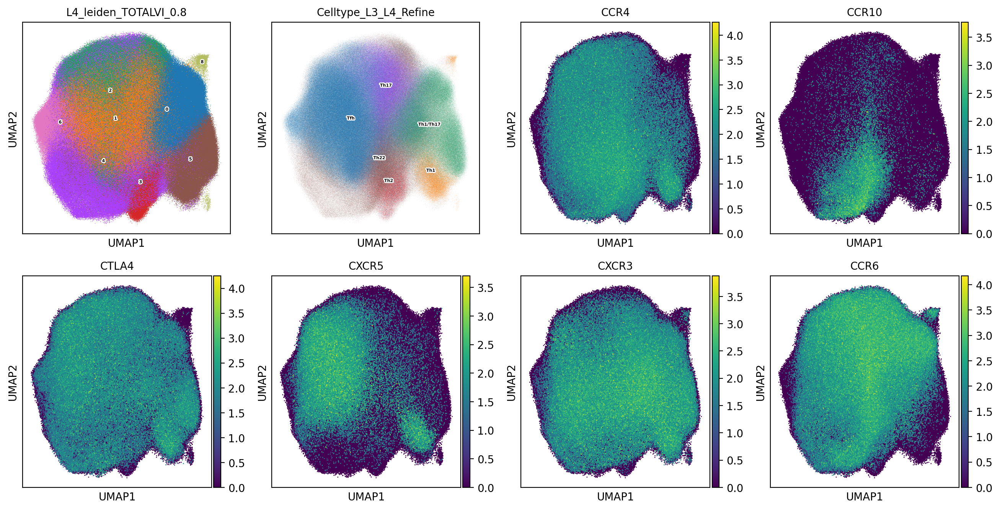

In [193]:
fig, axs = plt.subplots(ncols=4, nrows=2, figsize=(16, 8))
sc.pl.umap(adata, color=groupby,legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,0],show=False)
sc.pl.umap(adt, color='Celltype_L3_L4_Refine',legend_fontsize=4, legend_fontoutline=2,legend_loc='on data',ax=axs[0,1],show=False)
sc.pl.umap(adata, color='CCR4',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,2],show=False)
sc.pl.umap(adata, color='CCR10',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,3],show=False)
sc.pl.umap(adata, color='CTLA4',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[1,0],show=False)
sc.pl.umap(adata, color='CXCR5',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[1,1],show=False)
sc.pl.umap(adata, color='CXCR3',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[1,2],show=False)
sc.pl.umap(adata, color='CCR6',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[1,3],show=False)
plt.show()

In [ ]:
sc.pl.umap(adata, color='PRDM1',legend_fontsize=4, legend_fontoutline=2,legend_loc='on data')

... storing 'Celltype_L1_L2' as categorical
... storing 'Celltype_L1_L2_Refine' as categorical
... storing 'Celltype_L2_L3_Refine' as categorical
... storing 'Celltype_L3_L4_Refine' as categorical
... storing 'receptor_type' as categorical
... storing 'Celltype_L4_L5_Refine' as categorical


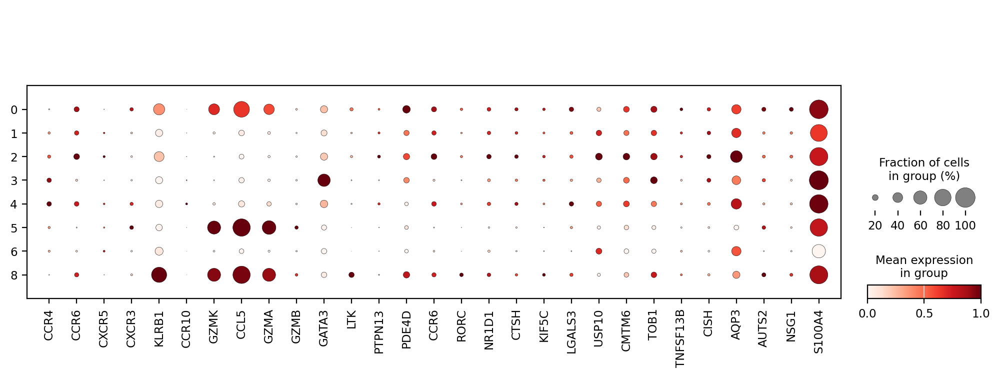

In [180]:
#Th17
sc.pl.dotplot(adata, ['CCR4','CCR6','CXCR5','CXCR3','KLRB1','CCR10','GZMK','CCL5','GZMA','GZMB','GATA3',
                      'LTK','PTPN13','PDE4D','CCR6','RORC','NR1D1','CTSH','KIF5C','LGALS3','USP10','CMTM6','TOB1',
                     'TNFSF13B','CISH','AQP3','AUTS2','NSG1','S100A4'],
              standard_scale='var',groupby=groupby)

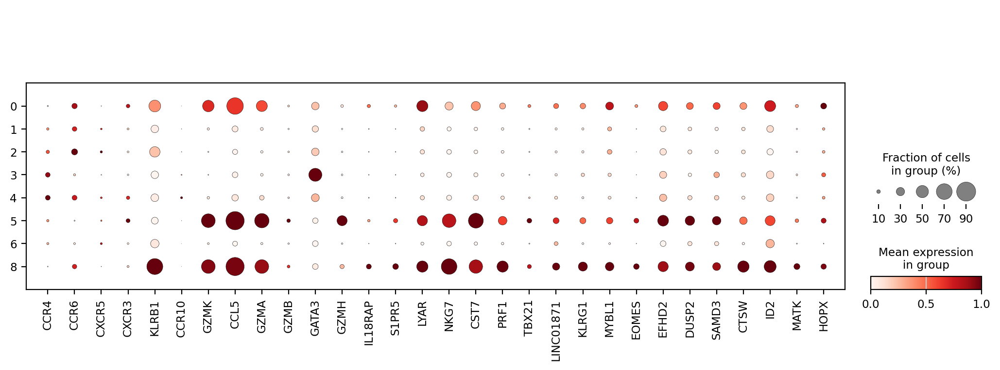

In [181]:
#Th1/Th17
sc.pl.dotplot(adata, ['CCR4','CCR6','CXCR5','CXCR3','KLRB1','CCR10','GZMK','CCL5','GZMA','GZMB','GATA3',
                      'GZMH','IL18RAP','S1PR5','LYAR','NKG7','CST7','PRF1','TBX21','LINC01871','KLRG1','MYBL1','EOMES',
                     'EFHD2','DUSP2','SAMD3','CTSW','ID2','MATK','HOPX',],
              standard_scale='var',groupby=groupby)

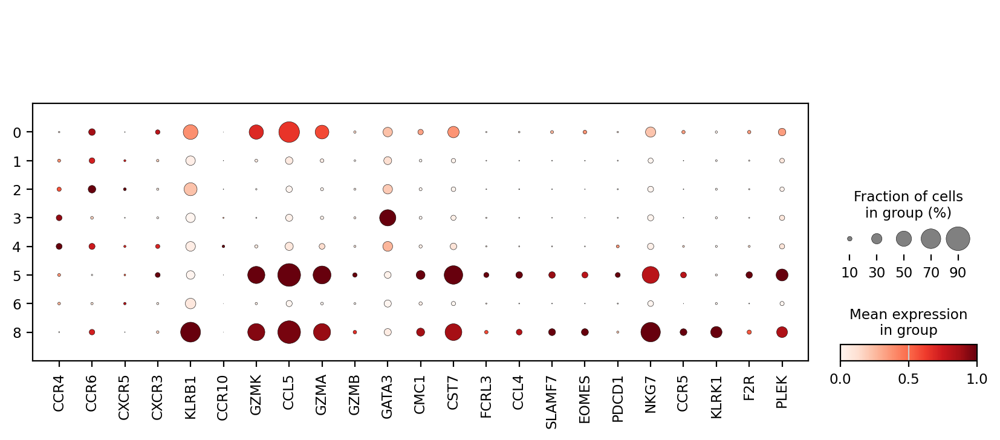

In [182]:
#Th1
sc.pl.dotplot(adata, ['CCR4','CCR6','CXCR5','CXCR3','KLRB1','CCR10','GZMK','CCL5','GZMA','GZMB','GATA3',
                      'CMC1','CST7','FCRL3','CCL4','SLAMF7','EOMES','PDCD1','NKG7','CCR5','KLRK1','F2R','PLEK'],
              standard_scale='var',groupby=groupby)

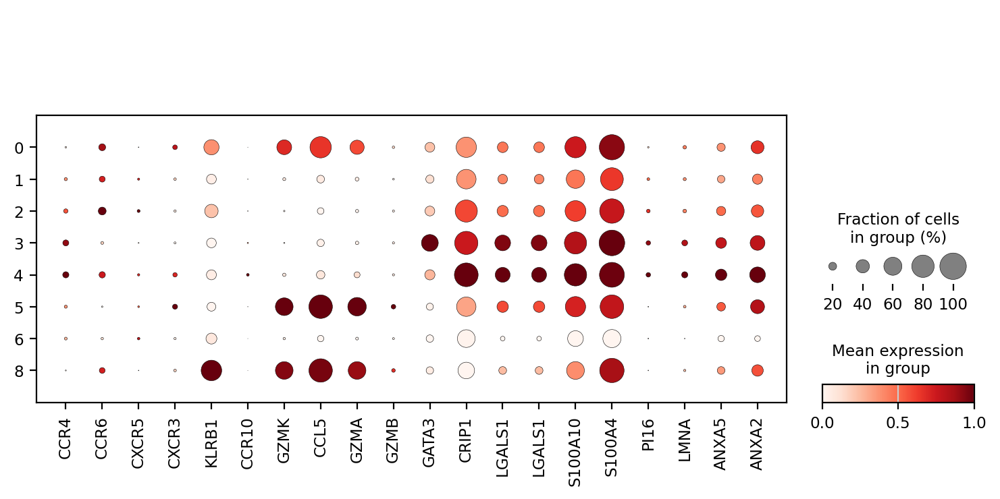

In [183]:
#Th22
sc.pl.dotplot(adata, ['CCR4','CCR6','CXCR5','CXCR3','KLRB1','CCR10','GZMK','CCL5','GZMA','GZMB','GATA3',
                      'CRIP1','LGALS1','LGALS1','S100A10','S100A4','PI16','LMNA','ANXA5','ANXA2'],
              standard_scale='var',groupby=groupby)

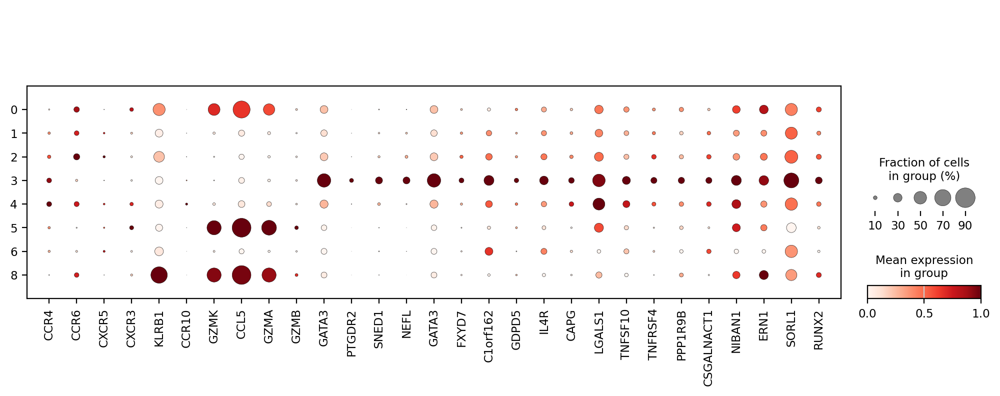

In [184]:
#Th2
sc.pl.dotplot(adata, ['CCR4','CCR6','CXCR5','CXCR3','KLRB1','CCR10','GZMK','CCL5','GZMA','GZMB','GATA3',
                      'PTGDR2','SNED1','NEFL','GATA3','FXYD7','C1orf162','GDPD5','IL4R','CAPG',
                     'LGALS1','TNFSF10','TNFRSF4','PPP1R9B','CSGALNACT1','NIBAN1','ERN1','SORL1','RUNX2'],
              standard_scale='var',groupby=groupby)

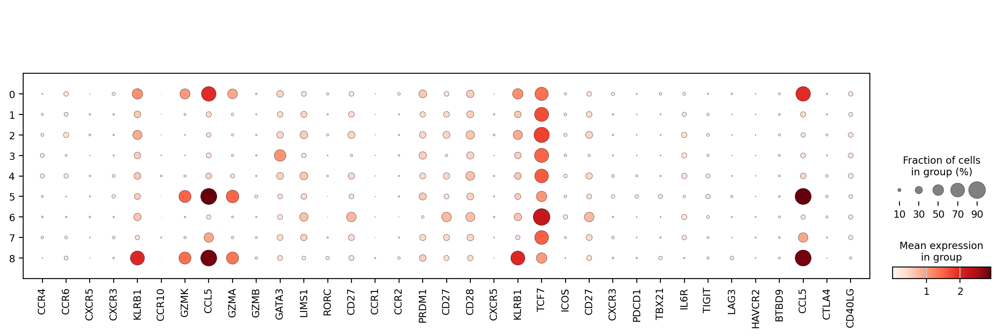

In [216]:
sc.pl.dotplot(adata, ['CCR4','CCR6','CXCR5','CXCR3','KLRB1','CCR10','GZMK','CCL5','GZMA','GZMB','GATA3',
                      'LIMS1','RORC','CD27','CCR1','CCR2','PRDM1','CD27','CD28','CXCR5','KLRB1',
                      'TCF7','ICOS','CD27','CXCR3','PDCD1','TBX21','IL6R','TIGIT','LAG3','HAVCR2','BTBD9',
                      'CCL5','CTLA4','CD40LG'],
              standard_scale='obs',groupby=groupby)

In [ ]:
adata.obs['cluster_dummy']="NOT"
adata.obs.loc[adata.obs[groupby]=="1",'cluster_dummy'] = "YES"
sc.pl.umap(adata, color='cluster_dummy')

In [ ]:
sc.pl.violin(adata,'SLC4A10',groupby=groupby,size=0.1)

In [529]:
adata.obs['L4_leiden_TOTALVI_0.8'].value_counts()

L4_leiden_TOTALVI_0.8
1    524066
2    473033
0    379218
4    325128
5    177612
6    100137
3     78482
8      4176
7       309
Name: count, dtype: int64

In [530]:
adata.obs['Celltype_L4_L5_Refine'] = adata.obs['Celltype_L3_L4_Refine']

In [531]:
adata = adata[adata.obs['L4_leiden_TOTALVI_0.8'] != "7",:]#Doublet|Lowquality

In [532]:
adata.strings_to_categoricals()

... storing 'Celltype_L1_L2' as categorical
... storing 'Celltype_L1_L2_Refine' as categorical
... storing 'Celltype_L2_L3_Refine' as categorical
... storing 'Celltype_L3_L4_Refine' as categorical
... storing 'receptor_type' as categorical
... storing 'Celltype_L4_L5_Refine' as categorical


In [533]:
adata.obs['Celltype_L4_L5_Refine'] = adata.obs['Celltype_L4_L5_Refine'].cat.add_categories(['MAIT'])
adata.obs['Celltype_L4_L5_Refine'] = adata.obs['Celltype_L4_L5_Refine'].cat.add_categories(['Vδ1 T'])
adata.obs['Celltype_L4_L5_Refine'] = adata.obs['Celltype_L4_L5_Refine'].cat.add_categories(['Doublet|Lowquality'])

In [535]:
#先
adata.obs.loc[adata.obs['L4_leiden_TOTALVI_0.8'] == '8','Celltype_L4_L5_Refine']='MAIT'
#后
adata.obs.loc[adata.obs['L4_leiden_TOTALVI_0.3'] == '2','Celltype_L4_L5_Refine']='Vδ1 T'
adata.obs.loc[(adata.obs['Celltype_L4_L5_Refine']=='Vδ1 T') & (adata.obs['receptor_type']=='TCR'),'Celltype_L4_L5_Refine']='Doublet|Lowquality'

In [536]:
adata.obs.loc[adata.obs['L4_leiden_TOTALVI_1.5'] == '13','Celltype_L4_L5_Refine']='Doublet|Lowquality'
adata.obs.loc[adata.obs['L4_leiden_TOTALVI_1.5'] == '25','Celltype_L4_L5_Refine']='Doublet|Lowquality'
adata.obs.loc[adata.obs['L4_leiden_TOTALVI_1.5'] == '26','Celltype_L4_L5_Refine']='Doublet|Lowquality'
adata.obs.loc[adata.obs['L4_leiden_TOTALVI_1.5'] == '27','Celltype_L4_L5_Refine']='Doublet|Lowquality'

In [537]:
adata = adata[adata.obs['Celltype_L4_L5_Refine'] != "Doublet|Lowquality",:]

In [538]:
adata.obs['Celltype_L4_L5_Refine'].value_counts()

Celltype_L4_L5_Refine
Tfh         1044251
Th1/Th17     327575
Th22         306655
Th17         223863
Th1           77710
Th2           77564
MAIT           3812
Vδ1 T           151
Name: count, dtype: int64

In [539]:
indices = adata.obs.loc[:,['Celltype_L1_L2','Celltype_L1_L2_Refine','Celltype_L2_L3_Refine','Celltype_L3_L4_Refine','Celltype_L4_L5_Refine','receptor_type','receptor_type_BCR']]
indices.to_csv(f"{obj_path}/{celltype}/R4_refine_indices_{celltype}.csv")

# 5. 定 Cytotoxic CD4+ T Cell Refine

In [36]:
celltype="CytotoxicCD4"
R_data_path = f"{obj_path}{celltype}"
sc.settings.figdir=f"{obj_path}{celltype}"

In [37]:
adata,adt,leiden_data = get_norm_annotation_data(celltype)

In [ ]:
sc.pl.umap(adata, color=['Celltype_L1_L2_Refine','Celltype_L2_L3_Refine','Celltype_L3_L4_Refine','receptor_type'],
           frameon=False,
           legend_fontsize=4, legend_fontoutline=2,
           size=4)

In [39]:
groupby = "L4_leiden_TOTALVI_0.5"

In [29]:
xlsx = pd.ExcelWriter(f"{obj_path}{celltype}/{groupby}_freq_table.xlsx")
for group in ['SampleID', 'DonorID','scDblFinder.class',
              'Immune_All_Low', 'Adult_Human_Blood', 'Adult_Human_Bone_marrow',
              'AIFI_L2', 'AIFI_L3', 'predicted.celltype.l2',
              
              ]:
    freq_table_multi = adata.obs.groupby([groupby, group]).size()
    pd.DataFrame(freq_table_multi).to_excel(xlsx,sheet_name=group)
xlsx.close()

In [ ]:
#数据簇间信息比较
fig, axs = plt.subplots(5, 2, figsize=(18, 12),constrained_layout=True)
plt.subplots_adjust(hspace=1,wspace=1)
sc.pl.violin(adata, keys='nCount_RNA', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[0,0], show=False)
sc.pl.violin(adata, keys='nFeature_RNA', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[0,1], show=False)
sc.pl.violin(adata, keys='log10GenesPerUMI', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[1,0], show=False)
sc.pl.violin(adata, keys='percent_top50', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[1,1], show=False)

sc.pl.violin(adata, keys='percent_apop', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[2,0], show=False)
sc.pl.violin(adata, keys='percent_ribo', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[2,1], show=False)
sc.pl.violin(adata, keys='percent_ieg', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[3,0], show=False)
sc.pl.violin(adata, keys='percent_oxphos', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[3,1], show=False)
sc.pl.violin(adata, keys='percent_hemo', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[4,0], show=False)
sc.pl.violin(adata, keys='G2M.Score', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[4,1], show=False)

fig.tight_layout()
plt.savefig(f'{obj_path}{celltype}/{groupby}_TOTALVI_L3_metadata.png')

In [31]:
sc.tl.dendrogram(adata,groupby=groupby,use_rep='X_TOTALVI')
sc.tl.dendrogram(adt,groupby=groupby,use_rep='X_TOTALVI')

In [ ]:
#cosg差异
cosg.cosg(adata, key_added=f'cosg_{groupby}', groupby=groupby,
          mu=10,n_genes_user=100,remove_lowly_expressed=True,
         )
df_tmp = pd.DataFrame(adata.uns[f'cosg_{groupby}']['names'])
df_tmp.to_csv(f"{obj_path}{celltype}/cosg_{groupby}.csv")
#cosg差异作图
df_tmp=pd.DataFrame(adata.uns[f'cosg_{groupby}']['names'][:8,]).T
df_tmp=df_tmp.reindex(adata.uns['dendrogram_'+groupby]['categories_ordered'])
marker_genes_list={idx: list(row.values) for idx, row in df_tmp.iterrows()}
marker_genes_list = {k: v for k, v in marker_genes_list.items() if not any(isinstance(x, float) for x in v)}
sc.pl.dotplot(adata, marker_genes_list,
             groupby=groupby,
             dendrogram=True,
             swap_axes=False,
             standard_scale='var',
             save=f'cosg_{groupby}',
             cmap='Spectral_r')

In [ ]:
#Th17
sc.pl.dotplot(adata, ['CCR4','CCR6','CXCR5','CXCR3','KLRB1','CCR10','GZMK','CCL5','GZMA','GZMB','GATA3',
                      'LTK','PTPN13','PDE4D','CCR6','RORC','NR1D1','CTSH','KIF5C','LGALS3','USP10','CMTM6','TOB1',
                     'TNFSF13B','CISH','AQP3','AUTS2','NSG1','S100A4'],
              standard_scale='var',groupby=groupby)

In [ ]:
#Th1/Th17
sc.pl.dotplot(adata, ['CCR4','CCR6','CXCR5','CXCR3','KLRB1','CCR10','GZMK','CCL5','GZMA','GZMB','GATA3',
                      'GZMH','IL18RAP','S1PR5','LYAR','NKG7','CST7','PRF1','TBX21','LINC01871','KLRG1','MYBL1','EOMES',
                     'EFHD2','DUSP2','SAMD3','CTSW','ID2','MATK','HOPX',],
              standard_scale='var',groupby=groupby)

In [ ]:
#Th1
sc.pl.dotplot(adata, ['CCR4','CCR6','CXCR5','CXCR3','KLRB1','CCR10','GZMK','CCL5','GZMA','GZMB','GATA3',
                      'CMC1','CST7','FCRL3','CCL4','SLAMF7','EOMES','PDCD1','NKG7','CCR5','KLRK1','F2R','PLEK'],
              standard_scale='var',groupby=groupby)

In [ ]:
#Th22
sc.pl.dotplot(adata, ['CCR4','CCR6','CXCR5','CXCR3','KLRB1','CCR10','GZMK','CCL5','GZMA','GZMB','GATA3',
                      'CRIP1','LGALS1','LGALS1','S100A10','S100A4','PI16','LMNA','ANXA5','ANXA2'],
              standard_scale='var',groupby=groupby)

In [ ]:
#Th2
sc.pl.dotplot(adata, ['CCR4','CCR6','CXCR5','CXCR3','KLRB1','CCR10','GZMK','CCL5','GZMA','GZMB','GATA3',
                      'PTGDR2','SNED1','NEFL','GATA3','FXYD7','C1orf162','GDPD5','IL4R','CAPG',
                     'LGALS1','TNFSF10','TNFRSF4','PPP1R9B','CSGALNACT1','NIBAN1','ERN1','SORL1','RUNX2'],
              standard_scale='obs',groupby=groupby)

In [ ]:
sc.pl.dotplot(adata, ['CCR4','CCR6','CXCR5','CXCR3','KLRB1','CCR10','GZMK','CCL5','GZMA','GZMB','GATA3',
                      'LIMS1','RORC','CD27','CCR1','CCR2','PRDM1','CD27','CD28','CXCR5','KLRB1',
                      'TCF7','ICOS','CD27','CXCR3','PDCD1','TBX21','IL6R','TIGIT','LAG3','HAVCR2','BTBD9',
                      'CCL5','CTLA4','CD40LG'],
              standard_scale='obs',groupby=groupby)

In [ ]:
fig, axs = plt.subplots(ncols=4, nrows=2, figsize=(16, 8))
sc.pl.umap(adata, color=groupby,legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,0],show=False)
sc.pl.umap(adata, color='GZMB',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,1],show=False)
sc.pl.umap(adata, color='CCR4',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,2],show=False)
sc.pl.umap(adata, color='KLRB1',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,3],show=False)
sc.pl.umap(adata, color='CTLA4',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[1,0],show=False)
sc.pl.umap(adt, color='CD45RA',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[1,1],show=False,layer='clr')
sc.pl.umap(adata, color='GZMK',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[1,2],show=False)
sc.pl.umap(adata, color='CCR6',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[1,3],show=False)
plt.show()

In [ ]:
sc.pl.umap(adata, color='TRDC',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data')

In [ ]:
adata.obs['cluster_dummy'] = adata.obs[groupby] == adata.obs[groupby].cat.categories[2]
sc.pl.umap(adata, color='cluster_dummy',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data')

In [ ]:
sc.pl.dotplot(adata, ['CCR4','CCR6','CXCR5','KLRB1','GZMK','CCL5','BTBD9','CXCR3','GATA3','CCR10',
                      'LIMS1','RORC','CD27','CCR1','CCR2','PRDM1','CD27','CD28','TRDV1',],
              standard_scale='var',groupby=groupby)

In [ ]:
sc.pl.dotplot(adata, ['CCR4','CCR6','CXCR5','CXCR3','KLRB1','CCR10','GZMK','CCL5','GZMB','BTBD9','GATA3',
                      'LIMS1','RORC','CD27','CCR1','CCR2','PRDM1','CD27','CD28','CXCR5','KLRB1',
                      'TCF7','ICOS','CD27','CXCR3','PDCD1','TBX21','IL6R','TIGIT','HAVCR2','LAG3',
                      'CCL5','CTLA4','CD40LG'],
              standard_scale='var',groupby=groupby)

In [ ]:
adata.obs['cluster_dummy']="NOT"
adata.obs.loc[adata.obs['L4_leiden_TOTALVI_1.5']=="15",'cluster_dummy'] = "YES"
sc.pl.umap(adata, color='cluster_dummy')

In [58]:
adata.obs[groupby].value_counts()

L4_leiden_TOTALVI_0.5
0    376669
2    306898
3     98833
4     67529
7     66681
6     44573
5     21990
8     13224
1     12342
Name: count, dtype: int64

In [59]:
#Naïve CD4+ T 需要CD45RA+ CCR7=CD197hi CD62Lhi
# effector memory T cells(TEM, CD45RA-/CCR7-)
# TEMRA cells, which are T cells that re-express CD45RA(CD45RA+/CCR7-)


cell_dict = {'Cytotoxic CD4+ T':['0','2','3','4','5','6','8'],#
             'Vδ2 T':['7'],
             'Doublet|Lowquality':['1',#ADT
                                  ],#
            }

In [60]:
check_dict_duplicates(cell_dict)

'无重复'

In [61]:
# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata.obs[groupby]).isin(cell_dict[i])
    adata.obs.loc[ind,'Celltype_L4_L5_Refine'] = i

In [62]:
(adata.obs['Celltype_L4_L5_Refine'].isna()).value_counts()

Celltype_L4_L5_Refine
False    1008739
Name: count, dtype: int64

In [63]:
adata.obs['Celltype_L4_L5_Refine'].value_counts()

Celltype_L4_L5_Refine
Cytotoxic CD4+ T      929716
Vδ2 T                  66681
Doublet|Lowquality     12342
Name: count, dtype: int64

In [64]:
adata = adata[adata.obs['L4_leiden_TOTALVI_1.5'] != "15",:]#CD56
adata = adata[adata.obs['L4_leiden_TOTALVI_1.5'] != "16",:]#CD4+ CD8+
adata = adata[adata.obs['L4_leiden_TOTALVI_1.5'] != "13",:]#CD16 CSF3R

In [65]:
adata.obs.loc[(adata.obs['Celltype_L4_L5_Refine']=='Vδ2 T') & (adata.obs['receptor_type']=='TCR'),'Celltype_L4_L5_Refine']='Doublet|Lowquality'

In [66]:
adata = adata[adata.obs['Celltype_L4_L5_Refine'] != "Doublet|Lowquality",:]

In [68]:
adata.obs['Celltype_L4_L5_Refine'].value_counts()

Celltype_L4_L5_Refine
Cytotoxic CD4+ T    835606
Vδ2 T                44058
Name: count, dtype: int64

In [69]:
indices = adata.obs.loc[:,['Celltype_L1_L2','Celltype_L1_L2_Refine','Celltype_L2_L3_Refine','Celltype_L3_L4_Refine','Celltype_L4_L5_Refine','receptor_type','receptor_type_BCR']]
indices.to_csv(f"{obj_path}/{celltype}/R4_refine_indices_{celltype}.csv")

# 6. 定 终 Naïve CD8+ T Cell Refine

In [20]:
celltype="NaiveCD8"
R_data_path = f"{obj_path}{celltype}"
sc.settings.figdir=f"{obj_path}{celltype}"

In [21]:
adata,adt,leiden_data = get_norm_annotation_data(celltype)

In [ ]:
sc.pl.umap(adata, color=['Celltype_L1_L2','Celltype_L1_L2_Refine','Celltype_L2_L3_Refine','receptor_type'],
           frameon=False,
           legend_fontsize=4, legend_fontoutline=2,
           size=4)

In [60]:
adata.obs.groupby(['L4_leiden_TOTALVI_0.3','receptor_type']).size()

L4_leiden_TOTALVI_0.3  receptor_type
0                      TCR              671202
1                      TCR              139323
2                      TCR              155731
3                      TCR               10979
4                      TCR                1459
dtype: int64

In [22]:
groupby = "L4_leiden_TOTALVI_0.3"

In [ ]:
xlsx = pd.ExcelWriter(f"{obj_path}{celltype}/{groupby}_freq_table.xlsx")
for group in ['SampleID', 'DonorID','scDblFinder.class',
              'Immune_All_Low', 'Adult_Human_Blood', 'Adult_Human_Bone_marrow',
              'AIFI_L2', 'AIFI_L3', 'predicted.celltype.l2',
              
              ]:
    freq_table_multi = adata.obs.groupby([groupby, group]).size()
    pd.DataFrame(freq_table_multi).to_excel(xlsx,sheet_name=group)
xlsx.close()

In [ ]:
#数据簇间信息比较
fig, axs = plt.subplots(5, 2, figsize=(18, 12),constrained_layout=True)
plt.subplots_adjust(hspace=1,wspace=1)
sc.pl.violin(adata, keys='nCount_RNA', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[0,0], show=False)
sc.pl.violin(adata, keys='nFeature_RNA', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[0,1], show=False)
sc.pl.violin(adata, keys='log10GenesPerUMI', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[1,0], show=False)
sc.pl.violin(adata, keys='percent_top50', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[1,1], show=False)

sc.pl.violin(adata, keys='percent_apop', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[2,0], show=False)
sc.pl.violin(adata, keys='percent_ribo', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[2,1], show=False)
sc.pl.violin(adata, keys='percent_ieg', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[3,0], show=False)
sc.pl.violin(adata, keys='percent_oxphos', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[3,1], show=False)
sc.pl.violin(adata, keys='percent_hemo', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[4,0], show=False)
sc.pl.violin(adata, keys='G2M.Score', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[4,1], show=False)

fig.tight_layout()
plt.savefig(f'{obj_path}{celltype}/{groupby}_TOTALVI_L3_metadata.png')

In [ ]:
sc.tl.dendrogram(adata,groupby=groupby,use_rep='X_TOTALVI')
sc.tl.dendrogram(adt,groupby=groupby,use_rep='X_TOTALVI')

In [ ]:
#cosg差异
cosg.cosg(adata, key_added=f'cosg_{groupby}', groupby=groupby,
          mu=10,n_genes_user=100,remove_lowly_expressed=True,
         )
df_tmp = pd.DataFrame(adata.uns[f'cosg_{groupby}']['names'])
df_tmp.to_csv(f"{obj_path}{celltype}/cosg_{groupby}.csv")
#cosg差异作图
df_tmp=pd.DataFrame(adata.uns[f'cosg_{groupby}']['names'][:8,]).T
df_tmp=df_tmp.reindex(adata.uns['dendrogram_'+groupby]['categories_ordered'])
marker_genes_list={idx: list(row.values) for idx, row in df_tmp.iterrows()}
marker_genes_list = {k: v for k, v in marker_genes_list.items() if not any(isinstance(x, float) for x in v)}
sc.pl.dotplot(adata, marker_genes_list,
             groupby=groupby,
             dendrogram=True,
             swap_axes=False,
             standard_scale='var',
             save=f'cosg_{groupby}',
             cmap='Spectral_r')

In [ ]:
fig, axs = plt.subplots(ncols=4, nrows=2, figsize=(16, 8))
sc.pl.umap(adata, color=groupby,legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,0],show=False)
sc.pl.umap(adata, color='CD8A',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,1],show=False)
sc.pl.umap(adata, color='CD4',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,2],show=False)
sc.pl.umap(adata, color='GZMK',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,3],show=False)

sc.pl.violin(adata,'KLRG1',groupby=groupby,show=False, ax=axs[1,0],size=0)
sc.pl.violin(adata,'PRF1',groupby=groupby,show=False, ax=axs[1,1],size=0)
sc.pl.violin(adata,'FCGR3B',groupby=groupby,show=False, ax=axs[1,2],size=0)
sc.pl.violin(adt,'CD45RA',groupby=groupby,show=False, ax=axs[1,3],size=0,layer='clr')
plt.show()

In [ ]:
adata.obs['cluster_dummy'] = adata.obs['L4_leiden_TOTALVI_1.5'] == adata.obs['L4_leiden_TOTALVI_1.5'].cat.categories[6]
sc.pl.umap(adata, color='cluster_dummy',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data')

In [ ]:
sc.pl.dotplot(adata, ['CCR4','CCR6','CXCR5','KLRB1','GZMK','CCL5','BTBD9','CXCR3','GATA3','CCR10',
                      'LIMS1','RORC','CD27','CCR1','CCR2','PRDM1','CD27','CD28','TRDV1','CD4'],
              standard_scale='var',groupby=groupby)

In [23]:
adata.obs['L4_leiden_TOTALVI_1.5'].value_counts()

L4_leiden_TOTALVI_1.5
7     188032
0     142868
1     138527
9     126704
10    124748
12    116023
2     102271
4      75354
6      65196
5      56270
3      53233
13     36658
11     19833
17      3121
14      2516
15       902
16       379
8        121
18        60
20        13
19        11
Name: count, dtype: int64

In [24]:
#naive (CD45RA+ CD45RO- CD62L+ CCR7+)
#central memory CD45RO and high levels of TCF7 and LEF1 transcripts) CD27+ CD45RA− 
#effector memory T (Tem) CD8+ subpopulations that expressed either granzyme K or granzyme B   CD27− CD45RA−

cell_dict = {'Doublet|Lowquality':['3',
                                   '4'#low UMI
                       ],
             'Naïve CD8+ T cells':['0','1','2'],#
            }

In [25]:
check_dict_duplicates(cell_dict)

'无重复'

In [26]:
# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata.obs[groupby]).isin(cell_dict[i])
    adata.obs.loc[ind,'Celltype_L4_L5_Refine'] = i

In [27]:
(adata.obs['Celltype_L4_L5_Refine'].isna()).value_counts()

Celltype_L4_L5_Refine
False    1252840
Name: count, dtype: int64

In [28]:
adata.obs['Celltype_L4_L5_Refine'].value_counts()

Celltype_L4_L5_Refine
Naïve CD8+ T cells    1235329
Doublet|Lowquality      17511
Name: count, dtype: int64

In [29]:
adata = adata[adata.obs['Celltype_L4_L5_Refine'] != "Doublet|Lowquality",:]

In [30]:
adata.obs['Celltype_L4_L5_Refine'].value_counts()

Celltype_L4_L5_Refine
Naïve CD8+ T cells    1235329
Name: count, dtype: int64

In [31]:
indices = adata.obs.loc[:,['Celltype_L1_L2','Celltype_L1_L2_Refine','Celltype_L2_L3_Refine','Celltype_L3_L4_Refine','Celltype_L4_L5_Refine',groupby,'receptor_type','receptor_type_BCR']]
indices['UMAP_1'] = adata.obsm['X_umap'][:, 0].copy()
indices['UMAP_2'] = adata.obsm['X_umap'][:, 1].copy()
indices.rename(columns={groupby: 'leiden_cluster'}, inplace=True) #Save the cluster categorical, check the relationship between clusters and clinical to avoid missing someone.
indices['leiden_cluster'] = celltype + " c" + indices['leiden_cluster'].astype(str)
os.makedirs(f'{finnal_path}/{celltype}', exist_ok=True)
indices.to_csv(f"{finnal_path}/{celltype}/Finnal_indices_{celltype}.csv")
indices.head()

,Celltype_L1_L2,Celltype_L1_L2_Refine,Celltype_L2_L3_Refine,Celltype_L3_L4_Refine,Celltype_L4_L5_Refine,leiden_cluster,receptor_type,receptor_type_BCR,UMAP_1,UMAP_2
D0589_Rep1_CAAGACTA_ACTATGCA_CGCTGATC,CD4+ T,Naïve CD4+ T,Naïve CD8+ T,Naïve CD8+ T,Naïve CD8+ T cells,NaiveCD8 c0,TCR,NaN,-2.244358,6.406971
D0589_Rep1_CCATCCTC_TGGCTTCA_GCTAACGA,CD4+ T,Naïve CD4+ T,Naïve CD8+ T,Naïve CD8+ T,Naïve CD8+ T cells,NaiveCD8 c1,TCR,NaN,-2.931036,5.935970
D0589_Rep1_ACACGACC_GAATCTGA_AGCAGGAA,CD4+ T,Naïve CD4+ T,Naïve CD8+ T,Naïve CD8+ T,Naïve CD8+ T cells,NaiveCD8 c2,TCR,NaN,0.909696,6.767426
D0589_Rep1_GACTAGTA_AATCCGTC_CGACACAC,CD4+ T,Naïve CD4+ T,Naïve CD8+ T,Naïve CD8+ T,Naïve CD8+ T cells,NaiveCD8 c0,TCR,NaN,-4.116621,1.701359
D0589_Rep1_AGATCGCA_ACCTCCAA_GCGAGTAA,CD4+ T,Naïve CD4+ T,Naïve CD8+ T,Naïve CD8+ T,Naïve CD8+ T cells,NaiveCD8 c0,TCR,NaN,-2.378188,6.790572


# 7. 定 Tcm CD8+ T Cell Refine

In [126]:
celltype="CD8Tcm"
R_data_path = f"{obj_path}{celltype}"
sc.settings.figdir=f"{obj_path}{celltype}"

In [127]:
adata,adt,leiden_data = get_norm_annotation_data(celltype)

In [ ]:
sc.pl.umap(adata, color=['Celltype_L1_L2_Refine','Celltype_L2_L3_Refine','Celltype_L3_L4_Refine'],
           frameon=False,
           legend_fontsize=4, legend_fontoutline=2,
           size=4)

In [128]:
groupby = "L4_leiden_TOTALVI_1.5"

In [101]:
xlsx = pd.ExcelWriter(f"{obj_path}{celltype}/{groupby}_freq_table.xlsx")
for group in ['SampleID', 'DonorID','scDblFinder.class',
              'Immune_All_Low', 'Adult_Human_Blood', 'Adult_Human_Bone_marrow',
              'AIFI_L2', 'AIFI_L3', 'predicted.celltype.l2',
              
              ]:
    freq_table_multi = adata.obs.groupby([groupby, group]).size()
    pd.DataFrame(freq_table_multi).to_excel(xlsx,sheet_name=group)
xlsx.close()

In [ ]:
#数据簇间信息比较
fig, axs = plt.subplots(5, 2, figsize=(18, 12),constrained_layout=True)
plt.subplots_adjust(hspace=1,wspace=1)
sc.pl.violin(adata, keys='nCount_RNA', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[0,0], show=False)
sc.pl.violin(adata, keys='nFeature_RNA', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[0,1], show=False)
sc.pl.violin(adata, keys='log10GenesPerUMI', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[1,0], show=False)
sc.pl.violin(adata, keys='percent_top50', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[1,1], show=False)

sc.pl.violin(adata, keys='percent_apop', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[2,0], show=False)
sc.pl.violin(adata, keys='percent_ribo', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[2,1], show=False)
sc.pl.violin(adata, keys='percent_ieg', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[3,0], show=False)
sc.pl.violin(adata, keys='percent_oxphos', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[3,1], show=False)
sc.pl.violin(adata, keys='percent_hemo', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[4,0], show=False)
sc.pl.violin(adata, keys='G2M.Score', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[4,1], show=False)

fig.tight_layout()
plt.savefig(f'{obj_path}{celltype}/{groupby}_TOTALVI_L3_metadata.png')

In [103]:
sc.tl.dendrogram(adata,groupby=groupby,use_rep='X_TOTALVI')
sc.tl.dendrogram(adt,groupby=groupby,use_rep='X_TOTALVI')

In [ ]:
#cosg差异
cosg.cosg(adata, key_added=f'cosg_{groupby}', groupby=groupby,
          mu=10,n_genes_user=100,remove_lowly_expressed=True,
         )
df_tmp = pd.DataFrame(adata.uns[f'cosg_{groupby}']['names'])
df_tmp.to_csv(f"{obj_path}{celltype}/cosg_{groupby}.csv")
#cosg差异作图
df_tmp=pd.DataFrame(adata.uns[f'cosg_{groupby}']['names'][:8,]).T
df_tmp=df_tmp.reindex(adata.uns['dendrogram_'+groupby]['categories_ordered'])
marker_genes_list={idx: list(row.values) for idx, row in df_tmp.iterrows()}
marker_genes_list = {k: v for k, v in marker_genes_list.items() if not any(isinstance(x, float) for x in v)}
sc.pl.dotplot(adata, marker_genes_list,
             groupby=groupby,
             dendrogram=True,
             swap_axes=False,
             standard_scale='var',
             save=f'cosg_{groupby}',
             cmap='Spectral_r')

In [ ]:
fig, axs = plt.subplots(ncols=4, nrows=2, figsize=(16, 8))
sc.pl.umap(adata, color=groupby,legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,0],show=False)
sc.pl.umap(adata, color='CD8A',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,1],show=False)
sc.pl.umap(adata, color='CD4',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,2],show=False)
sc.pl.umap(adata, color='GZMK',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,3],show=False)

sc.pl.violin(adata,'CXCR3',groupby=groupby,show=False, ax=axs[1,0],size=0)
sc.pl.umap(adata, color='CCR4',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[1,1],show=False)
sc.pl.umap(adata, color='CCL5',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[1,2],show=False)
sc.pl.violin(adt,'CD45RA',groupby=groupby,show=False, ax=axs[1,3],size=0,layer='clr')
plt.show()

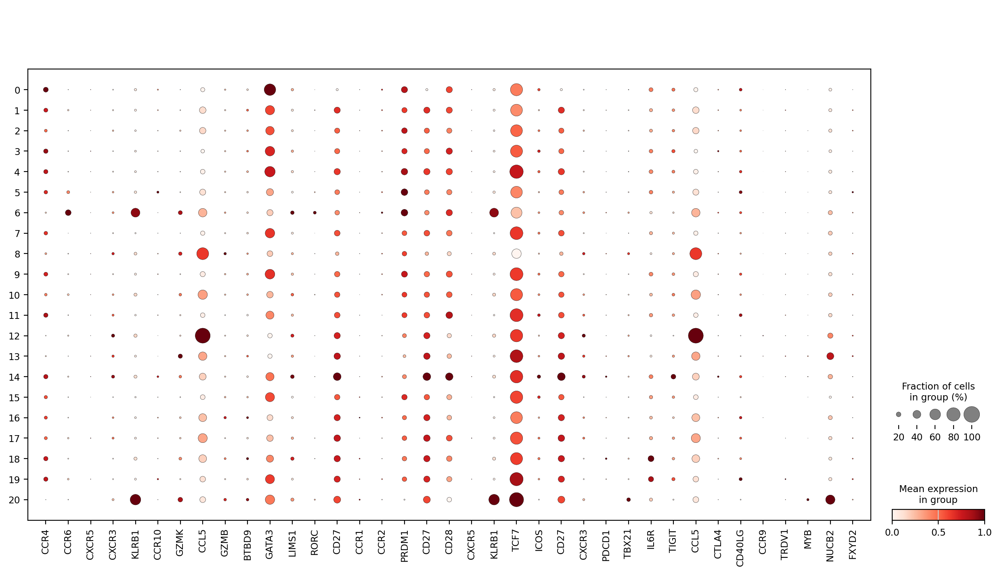

In [106]:
sc.pl.dotplot(adata, ['CCR4','CCR6','CXCR5','CXCR3','KLRB1','CCR10','GZMK','CCL5','GZMB','BTBD9','GATA3',
                      'LIMS1','RORC','CD27','CCR1','CCR2','PRDM1','CD27','CD28','CXCR5','KLRB1',
                      'TCF7','ICOS','CD27','CXCR3','PDCD1','TBX21','IL6R','TIGIT',
                      'CCL5','CTLA4','CD40LG','CCR9','TRDV1','MYB','NUCB2','FXYD2'],
              standard_scale='var',groupby=groupby)

In [ ]:
adata.obs['cluster_dummy'] = adata.obs['L4_leiden_TOTALVI_1.5'] == adata.obs['L4_leiden_TOTALVI_1.5'].cat.categories[13]
sc.pl.umap(adata, color='cluster_dummy',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data')

In [131]:
adata.obs[groupby].value_counts()

L4_leiden_TOTALVI_1.5
5     18857
7     16649
14    16500
0     14649
9     14635
12    14454
13    13987
4     12206
3      8775
2      6292
8      3519
6      1591
10     1572
17     1004
1       687
11      354
15      339
16      188
20      116
19      113
18       77
Name: count, dtype: int64

In [132]:
#naive (CD45RA+ CD45RO- CD62L+ CCR7+)
#central memory CD45RO and high levels of TCF7 and LEF1 transcripts) CD27+ CD45RA− 
#effector memory T (Tem) CD8+ subpopulations that expressed either granzyme K or granzyme B   CD27− CD45RA−

cell_dict = {'Doublet|Lowquality':['20',
                                   '9',#ADT
                                   '16','18',
                                  ],
             'Tcm CCR4- CCL5+ CD8+ T':['12','10','8','13',],#CD44 CCR4- CCL5+
             'MAIT':['6'],
             #CD45RA- KLRG1- TBX21- TCF7hi LEF1hi GATA3+
             #NELL2 #immunity Tcm CCR4+  TBX21- PRDM1=BLIMP1- EOMES- KLRG1-
             #CCR4+ GATA3+确认Tcm  CRIP2 GPR183  
             #immunity Tcm   PRDM1=BLIMP1+ EOMES- KLRG1-
             #分为Tcm CCR4- CCL5+ GZMKlo；Tcm CCR4+ CCL5- GZMK-； 
             'Tcm CCR4+ CCL5- CD8+ T':['0','1','2','3','4','5','7','11','14','15','17','19'],#CD44 CCR4- CCL5+
            }

In [133]:
check_dict_duplicates(cell_dict)

'无重复'

In [134]:
# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata.obs[groupby]).isin(cell_dict[i])
    adata.obs.loc[ind,'Celltype_L4_L5_Refine'] = i

In [135]:
(adata.obs['Celltype_L4_L5_Refine'].isna()).value_counts()

Celltype_L4_L5_Refine
False    146564
Name: count, dtype: int64

In [136]:
adata.obs['Celltype_L4_L5_Refine'].value_counts()

Celltype_L4_L5_Refine
Tcm CCR4+ CCL5- CD8+ T    96425
Tcm CCR4- CCL5+ CD8+ T    33532
Doublet|Lowquality        15016
MAIT                       1591
Name: count, dtype: int64

In [137]:
adata = adata[adata.obs['Celltype_L4_L5_Refine'] != "Doublet|Lowquality",:]

In [138]:
adata.obs['Celltype_L4_L5_Refine'].value_counts()

Celltype_L4_L5_Refine
Tcm CCR4+ CCL5- CD8+ T    96425
Tcm CCR4- CCL5+ CD8+ T    33532
MAIT                       1591
Name: count, dtype: int64

In [139]:
indices = adata.obs.loc[:,['Celltype_L1_L2','Celltype_L1_L2_Refine','Celltype_L2_L3_Refine','Celltype_L3_L4_Refine','Celltype_L4_L5_Refine','receptor_type','receptor_type_BCR']]
indices.to_csv(f"{obj_path}/{celltype}/R4_refine_indices_{celltype}.csv")

# 8. 定 Tem CD8+ T Cell Refine

In [192]:
celltype="TemCD8"
R_data_path = f"{obj_path}{celltype}"
sc.settings.figdir=f"{obj_path}{celltype}"

In [193]:
adata,adt,leiden_data = get_norm_annotation_data(celltype)

In [ ]:
sc.pl.umap(adata, color=['Celltype_L1_L2_Refine','Celltype_L2_L3_Refine','Celltype_L3_L4_Refine'],
           frameon=False,
           legend_fontsize=4, legend_fontoutline=2,
           size=4,
           legend_loc='on data')

In [ ]:
groupby = "L4_leiden_TOTALVI_0.5"

In [145]:
xlsx = pd.ExcelWriter(f"{obj_path}{celltype}/{groupby}_freq_table.xlsx")
for group in ['SampleID', 'DonorID','scDblFinder.class',
              'Immune_All_Low', 'Adult_Human_Blood', 'Adult_Human_Bone_marrow',
              'AIFI_L2', 'AIFI_L3', 'predicted.celltype.l2',
              
              ]:
    freq_table_multi = adata.obs.groupby([groupby, group]).size()
    pd.DataFrame(freq_table_multi).to_excel(xlsx,sheet_name=group)
xlsx.close()

In [146]:
cell_index = celltypist.samples.downsample_adata(adata,mode = 'each', n_cells = 5000,
                                                 by = groupby,
                                                 return_index = True,random_state=0)

In [ ]:
#数据簇间信息比较
fig, axs = plt.subplots(5, 2, figsize=(18, 12),constrained_layout=True)
plt.subplots_adjust(hspace=1,wspace=1)
sc.pl.violin(adata, keys='nCount_RNA', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[0,0], show=False)
sc.pl.violin(adata, keys='nFeature_RNA', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[0,1], show=False)
sc.pl.violin(adata, keys='log10GenesPerUMI', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[1,0], show=False)
sc.pl.violin(adata, keys='percent_top50', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[1,1], show=False)

sc.pl.violin(adata, keys='percent_apop', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[2,0], show=False)
sc.pl.violin(adata, keys='percent_ribo', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[2,1], show=False)
sc.pl.violin(adata, keys='percent_ieg', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[3,0], show=False)
sc.pl.violin(adata, keys='percent_oxphos', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[3,1], show=False)
sc.pl.violin(adata, keys='percent_hemo', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[4,0], show=False)
sc.pl.violin(adata, keys='G2M.Score', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[4,1], show=False)

fig.tight_layout()
plt.savefig(f'{obj_path}{celltype}/{groupby}_TOTALVI_L3_metadata.png')

In [148]:
sc.tl.dendrogram(adata,groupby=groupby,use_rep='X_TOTALVI')
sc.tl.dendrogram(adt,groupby=groupby,use_rep='X_TOTALVI')

**finished identifying marker genes by COSG**


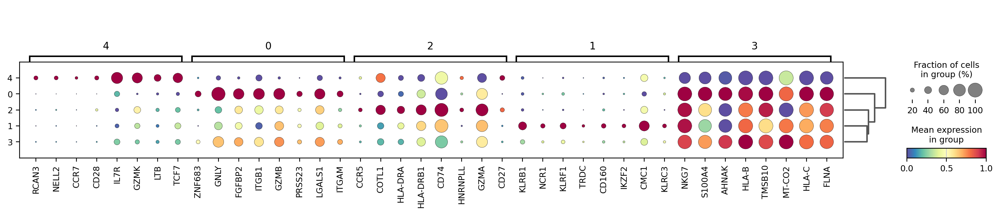

In [149]:
#cosg差异
cosg.cosg(adata, key_added=f'cosg_{groupby}', groupby=groupby,
          mu=10,n_genes_user=100,remove_lowly_expressed=True,
         )
df_tmp = pd.DataFrame(adata.uns[f'cosg_{groupby}']['names'])
df_tmp.to_csv(f"{obj_path}{celltype}/cosg_{groupby}.csv")
#cosg差异作图
df_tmp=pd.DataFrame(adata.uns[f'cosg_{groupby}']['names'][:8,]).T
df_tmp=df_tmp.reindex(adata.uns['dendrogram_'+groupby]['categories_ordered'])
marker_genes_list={idx: list(row.values) for idx, row in df_tmp.iterrows()}
marker_genes_list = {k: v for k, v in marker_genes_list.items() if not any(isinstance(x, float) for x in v)}
sc.pl.dotplot(adata, marker_genes_list,
             groupby=groupby,
             dendrogram=True,
             swap_axes=False,
             standard_scale='var',
             save=f'cosg_{groupby}',
             cmap='Spectral_r')

In [ ]:
fig, axs = plt.subplots(ncols=4, nrows=2, figsize=(16, 8))
sc.pl.umap(adata, color=groupby,legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,0],show=False)
sc.pl.umap(adata, color='GZMB',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,1],show=False)
sc.pl.umap(adata, color='CD27',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,2],show=False)
sc.pl.umap(adata, color='GZMK',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,3],show=False)

sc.pl.violin(adata,'KLRG1',groupby=groupby,show=False, ax=axs[1,0],size=0)
sc.pl.violin(adata,'PRF1',groupby=groupby,show=False, ax=axs[1,1],size=0)
sc.pl.violin(adata,'FCGR3B',groupby=groupby,show=False, ax=axs[1,2],size=0)
sc.pl.violin(adt,'CD27',groupby=groupby,show=False, ax=axs[1,3],size=0,layer='clr')
plt.show()

... storing 'Celltype_L1_L2' as categorical
... storing 'Celltype_L1_L2_Refine' as categorical
... storing 'Celltype_L2_L3_Refine' as categorical
... storing 'Celltype_L3_L4_Refine' as categorical
... storing 'receptor_type' as categorical


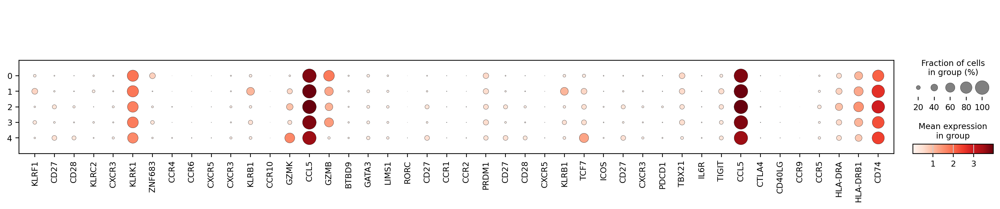

In [197]:
sc.pl.dotplot(adata, ['KLRF1','CD27','CD28','KLRC2','CXCR3','KLRK1','ZNF683',
                      
                      'CCR4','CCR6','CXCR5','CXCR3','KLRB1','CCR10','GZMK','CCL5','GZMB','BTBD9','GATA3',
                      'LIMS1','RORC','CD27','CCR1','CCR2','PRDM1','CD27','CD28','CXCR5','KLRB1',
                      'TCF7','ICOS','CD27','CXCR3','PDCD1','TBX21','IL6R','TIGIT',
                      'CCL5','CTLA4','CD40LG','CCR9','CCR5','HLA-DRA','HLA-DRB1','CD74'],
              standard_scale='obs',groupby=groupby)

In [195]:
adata.obs['L4_leiden_TOTALVI_0.8'].value_counts()

L4_leiden_TOTALVI_0.8
0    993789
4    816481
2    772966
3    746256
1    483688
6         7
7         5
8         4
5         3
Name: count, dtype: int64

In [201]:
adata.obs[groupby].value_counts()

L4_leiden_TOTALVI_0.5
0    1739151
4     908694
1     817436
2     268758
3      79160
Name: count, dtype: int64

In [202]:
#naive (CD45RA+ CD45RO- CD62L+ CCR7+)
#central memory CD45RO and high levels of TCF7 and LEF1 transcripts) CD27+ CD45RA− 
#effector memory T (Tem) CD8+ subpopulations that expressed either granzyme K or granzyme B   CD27− CD45RA−
#CD45RA+ CCL4 GZMK- Temra
cell_dict = {'Doublet|Lowquality':['3'],
             'Tem GZMK+ CD8+ T':['4',],#GZMK+ CD27+ TCF7++
             'Tem GZMB+ CD8+ T':['0',],# GZMB+ CD27- ZNF683
             'Tem HLA-DRhi CD8+ T':['2'],#GZMB+ CD27+ ZNF683- CCR5+ HLA-DRA HLA-DRB1 CD74
             'Temra CD8+ T':['1',],#GZMB+ KLRB1+ CD45RA+ KLRF1+ 
            }

In [203]:
check_dict_duplicates(cell_dict)

'无重复'

In [204]:
# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata.obs[groupby]).isin(cell_dict[i])
    adata.obs.loc[ind,'Celltype_L4_L5_Refine'] = i

In [205]:
(adata.obs['Celltype_L4_L5_Refine'].isna()).value_counts()

Celltype_L4_L5_Refine
False    3813199
Name: count, dtype: int64

In [206]:
adata.obs['Celltype_L4_L5_Refine'].value_counts()

Celltype_L4_L5_Refine
Tem GZMB+ CD8+ T       1739151
Tem GZMK+ CD8+ T        908694
Temra CD8+ T            817436
Tem HLA-DRhi CD8+ T     268758
Doublet|Lowquality       79160
Name: count, dtype: int64

In [207]:
adata = adata[adata.obs['L4_leiden_TOTALVI_0.8'] != "5",:]#CSF3R
adata = adata[adata.obs['L4_leiden_TOTALVI_0.8'] != "8",:]#ADT
adata = adata[adata.obs['L4_leiden_TOTALVI_0.8'] != "6",:]#
adata = adata[adata.obs['L4_leiden_TOTALVI_0.8'] != "7",:]#

In [208]:
adata = adata[adata.obs['Celltype_L4_L5_Refine'] != "Doublet|Lowquality",:]

In [209]:
adata.obs['Celltype_L4_L5_Refine'].value_counts()

Celltype_L4_L5_Refine
Tem GZMB+ CD8+ T       1739137
Tem GZMK+ CD8+ T        908690
Temra CD8+ T            817435
Tem HLA-DRhi CD8+ T     268758
Name: count, dtype: int64

In [210]:
indices = adata.obs.loc[:,['Celltype_L1_L2','Celltype_L1_L2_Refine','Celltype_L2_L3_Refine','Celltype_L3_L4_Refine','Celltype_L4_L5_Refine','receptor_type','receptor_type_BCR']]
indices.to_csv(f"{obj_path}/{celltype}/R4_refine_indices_{celltype}.csv")

# 9. 定 MAIT Cell Refine

In [178]:
celltype="MAIT"
R_data_path = f"{obj_path}{celltype}"
sc.settings.figdir=f"{obj_path}{celltype}"

In [179]:
adata,adt,leiden_data = get_norm_annotation_data(celltype)

In [ ]:
sc.pl.umap(adata, color=['Celltype_L1_L2_Refine','Celltype_L2_L3_Refine','Celltype_L3_L4_Refine'],
           frameon=False,
           legend_fontsize=4, legend_fontoutline=2,
           size=4,
           legend_loc='on data')

In [181]:
groupby = "L4_leiden_TOTALVI_0.5"

In [366]:
xlsx = pd.ExcelWriter(f"{obj_path}{celltype}/{groupby}_freq_table.xlsx")
for group in ['SampleID', 'DonorID','scDblFinder.class',
              'Immune_All_Low', 'Adult_Human_Blood', 'Adult_Human_Bone_marrow',
              'AIFI_L2', 'AIFI_L3', 'predicted.celltype.l2',
              
              ]:
    freq_table_multi = adata.obs.groupby([groupby, group]).size()
    pd.DataFrame(freq_table_multi).to_excel(xlsx,sheet_name=group)
xlsx.close()

In [ ]:
#数据簇间信息比较
fig, axs = plt.subplots(5, 2, figsize=(18, 12),constrained_layout=True)
plt.subplots_adjust(hspace=1,wspace=1)
sc.pl.violin(adata, keys='nCount_RNA', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[0,0], show=False)
sc.pl.violin(adata, keys='nFeature_RNA', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[0,1], show=False)
sc.pl.violin(adata, keys='log10GenesPerUMI', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[1,0], show=False)
sc.pl.violin(adata, keys='percent_top50', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[1,1], show=False)

sc.pl.violin(adata, keys='percent_apop', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[2,0], show=False)
sc.pl.violin(adata, keys='percent_ribo', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[2,1], show=False)
sc.pl.violin(adata, keys='percent_ieg', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[3,0], show=False)
sc.pl.violin(adata, keys='percent_oxphos', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[3,1], show=False)
sc.pl.violin(adata, keys='percent_hemo', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[4,0], show=False)
sc.pl.violin(adata, keys='G2M.Score', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[4,1], show=False)

fig.tight_layout()
plt.savefig(f'{obj_path}{celltype}/{groupby}_TOTALVI_L3_metadata.png')

In [368]:
sc.tl.dendrogram(adata,groupby=groupby,use_rep='X_TOTALVI')
sc.tl.dendrogram(adt,groupby=groupby,use_rep='X_TOTALVI')

**finished identifying marker genes by COSG**


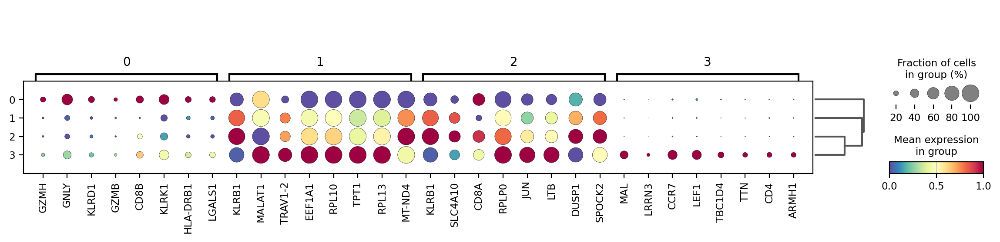

In [369]:
#cosg差异
cosg.cosg(adata, key_added=f'cosg_{groupby}', groupby=groupby,
          mu=10,n_genes_user=100,remove_lowly_expressed=True,
         )
df_tmp = pd.DataFrame(adata.uns[f'cosg_{groupby}']['names'])
df_tmp.to_csv(f"{obj_path}{celltype}/cosg_{groupby}.csv")
#cosg差异作图
df_tmp=pd.DataFrame(adata.uns[f'cosg_{groupby}']['names'][:8,]).T
df_tmp=df_tmp.reindex(adata.uns['dendrogram_'+groupby]['categories_ordered'])
marker_genes_list={idx: list(row.values) for idx, row in df_tmp.iterrows()}
marker_genes_list = {k: v for k, v in marker_genes_list.items() if not any(isinstance(x, float) for x in v)}
sc.pl.dotplot(adata, marker_genes_list,
             groupby=groupby,
             dendrogram=True,
             swap_axes=False,
             standard_scale='var',
             save=f'cosg_{groupby}',
             cmap='Spectral_r')

In [ ]:
fig, axs = plt.subplots(ncols=4, nrows=2, figsize=(16, 8))
sc.pl.umap(adata, color=groupby,legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,0],show=False)
sc.pl.umap(adata, color='TRAV1-2',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,1],show=False)
sc.pl.umap(adata, color='CD14',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,2],show=False)
sc.pl.umap(adata, color='CD4',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,3],show=False)
#sc.pl.violin(adt,'CD45RA',groupby=groupby,show=False, ax=axs[0,3],size=0.5)
#TNFAIP3/CXCR4/DDIT4/FOSL2/IRS2/BTG1/ZFP36/PNRC1/CDKN1B/PLIN2/BHLHE40/PLAUR/ETS1/DUSP1
#SELL/TXNIP/IFITM2/B2M/HLA-C

sc.pl.violin(adata,'CD3D',groupby=groupby,show=False, ax=axs[1,0],size=0.5)
sc.pl.violin(adata,'KLRB1',groupby=groupby,show=False, ax=axs[1,1],size=0.5)
sc.pl.violin(adata,'TRAV1-2',groupby=groupby,show=False, ax=axs[1,2],size=0.5)
sc.pl.violin(adata,'SLC4A10',groupby=groupby,show=False, ax=axs[1,3],size=0.5)
plt.show()

In [371]:
adata.obs[groupby].value_counts()

L4_leiden_TOTALVI_0.5
2    150147
0     91490
1     75428
3      3256
Name: count, dtype: int64

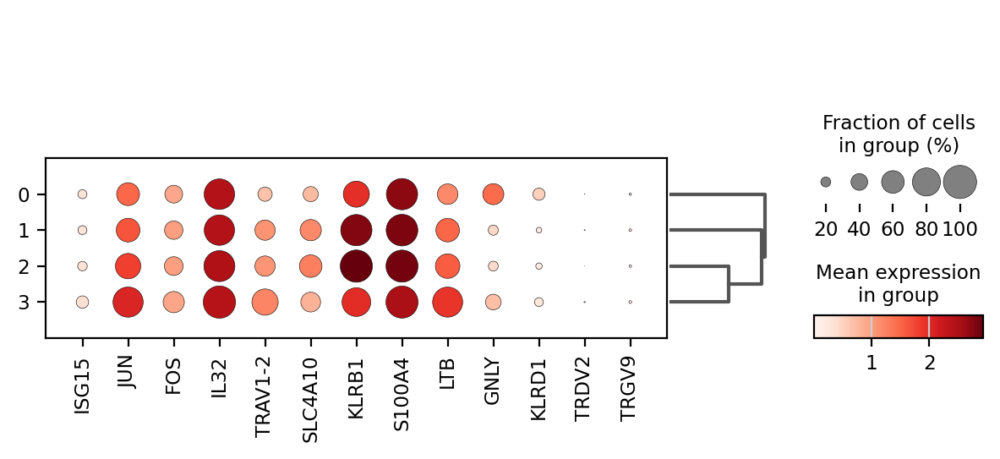

In [372]:
sc.pl.dotplot(adata, ['ISG15','JUN','FOS','IL32','TRAV1-2','SLC4A10','KLRB1','S100A4','LTB','GNLY','KLRD1','TRDV2','TRGV9'],
              standard_scale='obs',groupby=groupby,dendrogram=True)

... storing 'Celltype_L1_L2' as categorical
... storing 'Celltype_L1_L2_Refine' as categorical
... storing 'Celltype_L2_L3_Refine' as categorical
... storing 'Celltype_L3_L4_Refine' as categorical
... storing 'receptor_type' as categorical


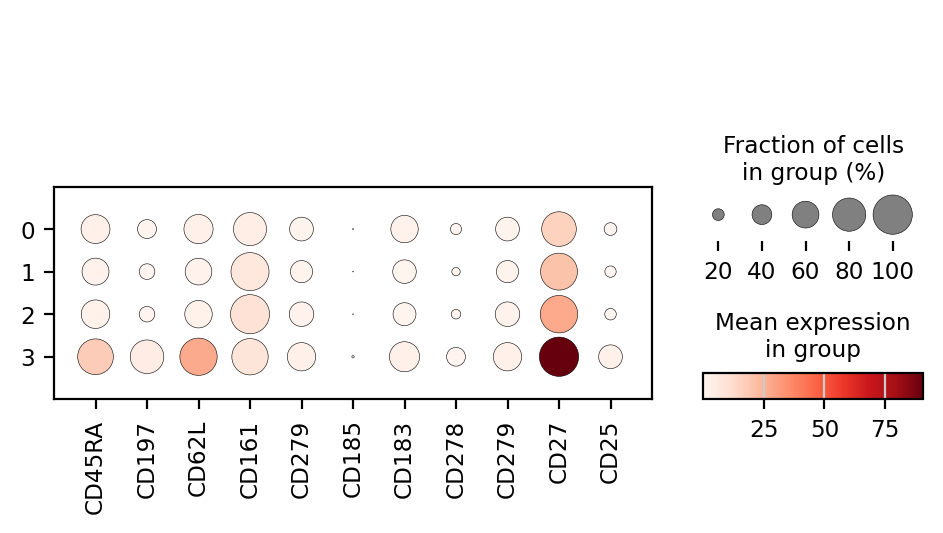

In [373]:
#CD185 (CXCR5) CD183 (CXCR3) CD278 (ICOS) CD279 (PD1)
sc.pl.dotplot(adt, ['CD45RA','CD197','CD62L','CD161','CD279','CD185','CD183','CD278','CD279','CD27','CD25'],
              standard_scale='obs',groupby=groupby)

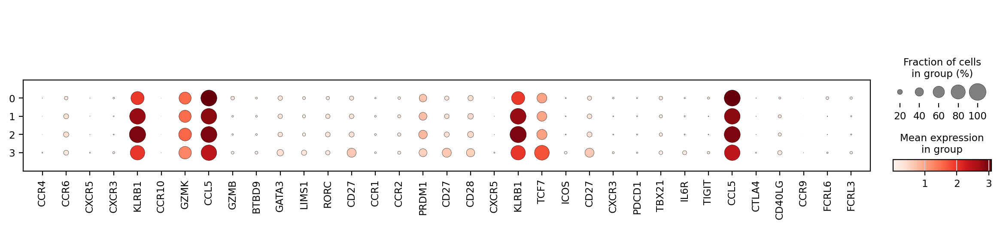

In [374]:
sc.pl.dotplot(adata, ['CCR4','CCR6','CXCR5','CXCR3','KLRB1','CCR10','GZMK','CCL5','GZMB','BTBD9','GATA3',
                      'LIMS1','RORC','CD27','CCR1','CCR2','PRDM1','CD27','CD28','CXCR5','KLRB1',
                      'TCF7','ICOS','CD27','CXCR3','PDCD1','TBX21','IL6R','TIGIT',
                      'CCL5','CTLA4','CD40LG','CCR9','FCRL6','FCRL3'],
              standard_scale='obs',groupby=groupby)

In [182]:
cell_dict={
    'Doublet|Lowquality':['3',#CD4CD8
              ],
    'MAIT':['0','1','2'],#
}

#存在CD56- MAIT和CD56+ MAIT(8) https://www.nature.com/articles/s41590-023-01575-1#Abs1

In [183]:
check_dict_duplicates(cell_dict)

'无重复'

In [184]:
# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata.obs[groupby]).isin(cell_dict[i])
    adata.obs.loc[ind,'Celltype_L4_L5_Refine'] = i

In [185]:
(adata.obs['Celltype_L4_L5_Refine'].isna()).value_counts()

Celltype_L4_L5_Refine
False    320321
Name: count, dtype: int64

In [186]:
adata.obs['Celltype_L4_L5_Refine'].value_counts()

Celltype_L4_L5_Refine
MAIT                  317065
Doublet|Lowquality      3256
Name: count, dtype: int64

In [187]:
adata = adata[adata.obs['Celltype_L4_L5_Refine'] != "Doublet|Lowquality",:]

In [191]:
adata.obs['Celltype_L4_L5_Refine'].value_counts()

Celltype_L4_L5_Refine
MAIT    317065
Name: count, dtype: int64

In [190]:
indices = adata.obs.loc[:,['Celltype_L1_L2','Celltype_L1_L2_Refine','Celltype_L2_L3_Refine','Celltype_L3_L4_Refine','Celltype_L4_L5_Refine','receptor_type','receptor_type_BCR']]
indices.to_csv(f"{obj_path}/{celltype}/R4_refine_indices_{celltype}.csv")

# 10. 定 gdT Refine

In [211]:
celltype="gdT"
R_data_path = f"{obj_path}{celltype}"
sc.settings.figdir=f"{obj_path}{celltype}"

In [212]:
adata,adt,leiden_data = get_norm_annotation_data(celltype)

In [ ]:
sc.pl.umap(adata, color=['Celltype_L1_L2_Refine','Celltype_L2_L3_Refine','Celltype_L3_L4_Refine','receptor_type'],
           frameon=False,
           legend_fontsize=4, legend_fontoutline=2,
           size=4)

In [214]:
groupby = "L4_leiden_TOTALVI_0.3"

In [215]:
xlsx = pd.ExcelWriter(f"{obj_path}{celltype}/{groupby}_freq_table.xlsx")
for group in ['SampleID', 'DonorID','scDblFinder.class',
              'Immune_All_Low', 'Adult_Human_Blood', 'Adult_Human_Bone_marrow',
              'AIFI_L2', 'AIFI_L3', 'predicted.celltype.l2',
              
              ]:
    freq_table_multi = adata.obs.groupby([groupby, group]).size()
    pd.DataFrame(freq_table_multi).to_excel(xlsx,sheet_name=group)
xlsx.close()

In [ ]:
#数据簇间信息比较
fig, axs = plt.subplots(5, 2, figsize=(18, 12),constrained_layout=True)
plt.subplots_adjust(hspace=1,wspace=1)
sc.pl.violin(adata, keys='nCount_RNA', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[0,0], show=False)
sc.pl.violin(adata, keys='nFeature_RNA', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[0,1], show=False)
sc.pl.violin(adata, keys='log10GenesPerUMI', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[1,0], show=False)
sc.pl.violin(adata, keys='percent_top50', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[1,1], show=False)

sc.pl.violin(adata, keys='percent_apop', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[2,0], show=False)
sc.pl.violin(adata, keys='percent_ribo', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[2,1], show=False)
sc.pl.violin(adata, keys='percent_ieg', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[3,0], show=False)
sc.pl.violin(adata, keys='percent_oxphos', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[3,1], show=False)
sc.pl.violin(adata, keys='percent_hemo', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[4,0], show=False)
sc.pl.violin(adata, keys='G2M.Score', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[4,1], show=False)

fig.tight_layout()
plt.savefig(f'{obj_path}{celltype}/{groupby}_TOTALVI_L3_metadata.png')

In [217]:
sc.tl.dendrogram(adata,groupby=groupby,use_rep='X_TOTALVI')
sc.tl.dendrogram(adt,groupby=groupby,use_rep='X_TOTALVI')

**finished identifying marker genes by COSG**


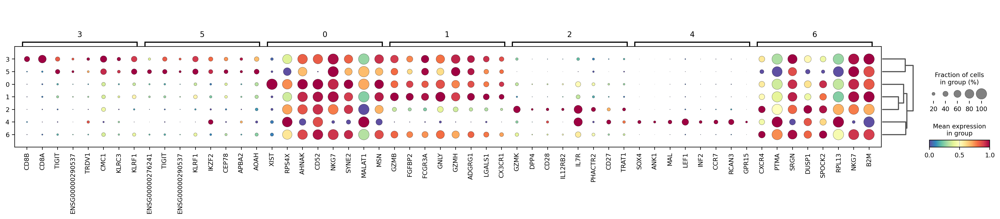

In [218]:
#cosg差异
cosg.cosg(adata, key_added=f'cosg_{groupby}', groupby=groupby,
          mu=10,n_genes_user=100,remove_lowly_expressed=True,
         )
df_tmp = pd.DataFrame(adata.uns[f'cosg_{groupby}']['names'])
df_tmp.to_csv(f"{obj_path}{celltype}/cosg_{groupby}.csv")
#cosg差异作图
df_tmp=pd.DataFrame(adata.uns[f'cosg_{groupby}']['names'][:8,]).T
df_tmp=df_tmp.reindex(adata.uns['dendrogram_'+groupby]['categories_ordered'])
marker_genes_list={idx: list(row.values) for idx, row in df_tmp.iterrows()}
marker_genes_list = {k: v for k, v in marker_genes_list.items() if not any(isinstance(x, float) for x in v)}
sc.pl.dotplot(adata, marker_genes_list,
             groupby=groupby,
             dendrogram=True,
             swap_axes=False,
             standard_scale='var',
             save=f'cosg_{groupby}',
             cmap='Spectral_r')

In [ ]:
fig, axs = plt.subplots(ncols=4, nrows=2, figsize=(16, 8))
sc.pl.umap(adata, color=groupby,legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,0],show=False)
sc.pl.umap(adata, color='TRDV1',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,1],show=False)
sc.pl.umap(adata, color='TIGIT',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,2],show=False)
sc.pl.umap(adata, color='KLRF1',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,3],show=False)

sc.pl.violin(adata,'TRDV2',groupby=groupby,show=False, ax=axs[1,0],size=0.5)
sc.pl.violin(adata,'TRGV9',groupby=groupby,show=False, ax=axs[1,1],size=0.5)
sc.pl.violin(adata,'CD3D',groupby=groupby,show=False, ax=axs[1,2],size=0.5)
sc.pl.violin(adt,'CD27',groupby=groupby,show=False, ax=axs[1,3],size=0.5,layer='clr')
plt.show()

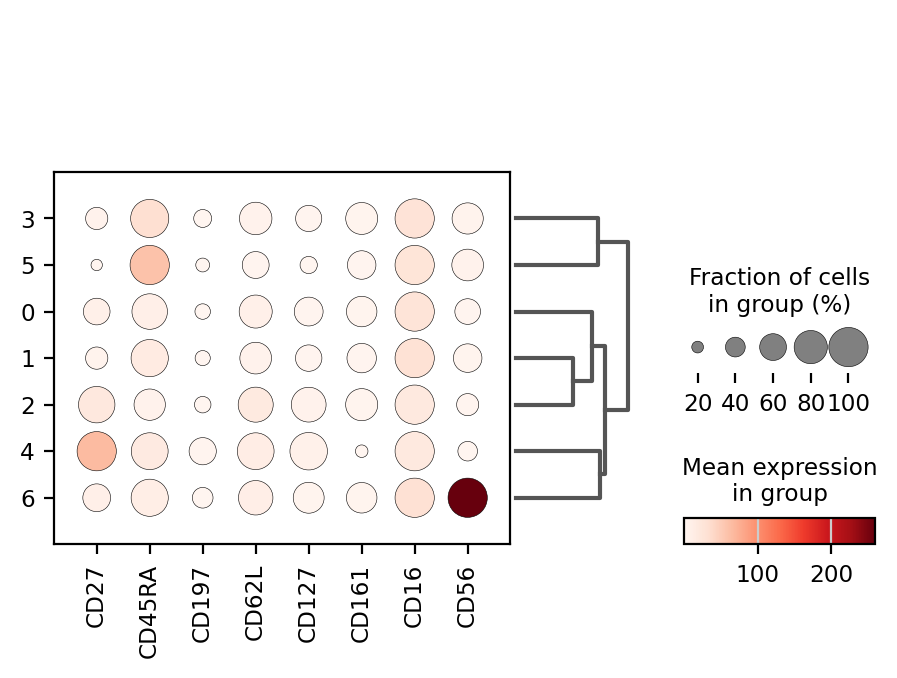

In [220]:
sc.pl.dotplot(adt, ['CD27','CD45RA','CD197','CD62L','CD127','CD161','CD16','CD56'],
              groupby=groupby,dendrogram=True)

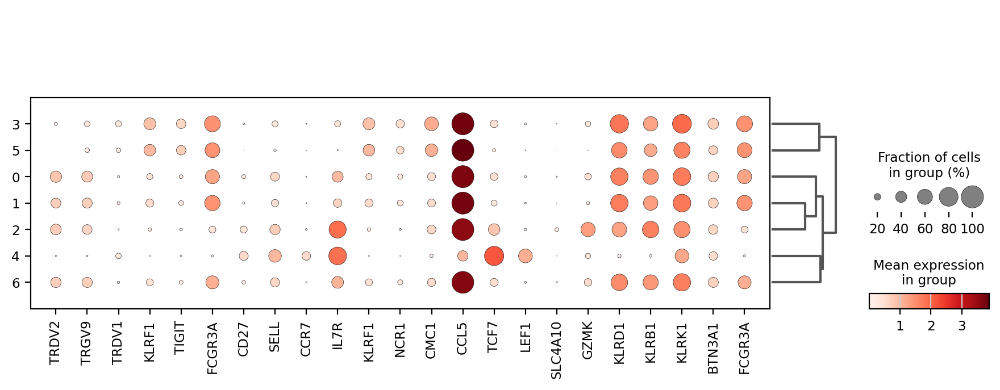

In [221]:
sc.pl.dotplot(adata, ['TRDV2','TRGV9','TRDV1','KLRF1','TIGIT','FCGR3A','CD27','SELL','CCR7','IL7R','KLRF1','NCR1','CMC1',
                      'CCL5','TCF7','LEF1','SLC4A10','GZMK','KLRD1','KLRB1','KLRK1','BTN3A1','FCGR3A'],
              standard_scale='obs',groupby=groupby,dendrogram=True)

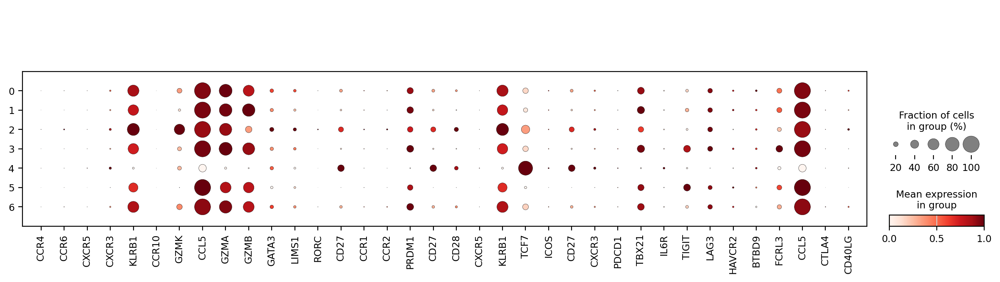

In [222]:
sc.pl.dotplot(adata, ['CCR4','CCR6','CXCR5','CXCR3','KLRB1','CCR10','GZMK','CCL5','GZMA','GZMB','GATA3',
                      'LIMS1','RORC','CD27','CCR1','CCR2','PRDM1','CD27','CD28','CXCR5','KLRB1',
                      'TCF7','ICOS','CD27','CXCR3','PDCD1','TBX21','IL6R','TIGIT','LAG3','HAVCR2','BTBD9','FCRL3',
                      'CCL5','CTLA4','CD40LG'],
              standard_scale='var',groupby=groupby)

In [223]:
adata.obs[groupby].value_counts()

L4_leiden_TOTALVI_0.3
1    537009
2    299958
0     62753
4     35677
3     15173
5      3738
6      1291
Name: count, dtype: int64

In [224]:
cell_dict={
    'Vδ1 T':['3',],#CD27- KLRF1 ITGIT TRDV1 CD45RA+ CCL5+  KLRF1+ NCR1+ CMC1+
    'Naive Vδ1 T':['4',],#CD27- KLRF1 ITGIT TRDV1 CD45RA+ CCL5+  KLRF1+ NCR1+ CMC1+
    'Vδ2 T':['0','1','2','6'],# CD45RA- Vγ9Vδ2 cells
    'Doublet|Lowquality':['5',],
}
#gdT 在血液中多是CD45RA- CD27+/-

# #γδ T；https://www.nature.com/articles/s41467-018-04076-0；
# https://www.nature.com/articles/s41392-023-01653-8#Sec12 #CD8+ gdT=Vδ1+  CD56+γδT存在
# Vδ2+ T cells were predominantly CD27+CD45RA−: https://journals.aai.org/jimmunol/article/197/12/4584/109106/CD8-T-Cells-A-Novel-T-Cell-Subset-with-a-Potential

# Vδ1+ T  https://www.cell.com/cell-reports/fulltext/S2211-1247(22)00631-3

# γδT细胞根据TCR的γ（包括2/3/4/5/8/9）和δ（包括1/2/3/5）链的表达，γδT细胞主要分为三个亚群：Vδ1T细胞，Vδ2T细胞和Vδ3T细胞。
# Vδ1T细胞主要存在于粘膜上皮细胞中，Vδ2T细胞主要分布在外周血中，Vδ3T细胞主要分布肝和肠。
# 基于CD27和CD45RA的表达差异Vδ2T细胞又分为CD45RA + CD27 +（幼稚），CD45RA-CD27 +（中间，无记忆效应功能），
# CD45RA-CD27-（记忆效应）和CD45RA + CD27-（终末分化）四群。
# 另外，γδT细胞也可分为多个功能亚群：产IFN-γ，产IL-17AγδT细胞和抗原呈递γδT细胞。

In [225]:
check_dict_duplicates(cell_dict)

'无重复'

In [226]:
# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata.obs[groupby]).isin(cell_dict[i])
    adata.obs.loc[ind,'Celltype_L4_L5_Refine'] = i

In [227]:
(adata.obs['Celltype_L4_L5_Refine'].isna()).value_counts()

Celltype_L4_L5_Refine
False    955599
Name: count, dtype: int64

In [228]:
adata.obs['Celltype_L4_L5_Refine'].value_counts()

Celltype_L4_L5_Refine
Vδ2 T                 901011
Naive Vδ1 T            35677
Vδ1 T                  15173
Doublet|Lowquality      3738
Name: count, dtype: int64

In [229]:
adata = adata[adata.obs['Celltype_L4_L5_Refine'] != "Doublet|Lowquality",:]

In [230]:
adata.obs['Celltype_L4_L5_Refine'].value_counts()

Celltype_L4_L5_Refine
Vδ2 T          901011
Naive Vδ1 T     35677
Vδ1 T           15173
Name: count, dtype: int64

In [231]:
indices = adata.obs.loc[:,['Celltype_L1_L2','Celltype_L1_L2_Refine','Celltype_L2_L3_Refine','Celltype_L3_L4_Refine','Celltype_L4_L5_Refine','receptor_type','receptor_type_BCR']]
indices.to_csv(f"{obj_path}/{celltype}/R4_refine_indices_{celltype}.csv")

# 11. 定 ProliferativeT Cell Refine

In [585]:
celltype="ProliferativeT"
R_data_path = f"{obj_path}{celltype}"
sc.settings.figdir=f"{obj_path}{celltype}"

In [586]:
adata,adt,leiden_data = get_norm_annotation_data(celltype)

In [ ]:
sc.pl.umap(adata, color=['Celltype_L1_L2_Refine','Celltype_L2_L3_Refine','Celltype_L3_L4_Refine'],
           frameon=False,
           legend_fontsize=4, legend_fontoutline=2,
           size=4,
           legend_loc='on data')

In [587]:
groupby = "L4_leiden_TOTALVI_1.5"

In [240]:
xlsx = pd.ExcelWriter(f"{obj_path}{celltype}/{groupby}_freq_table.xlsx")
for group in ['SampleID', 'DonorID','scDblFinder.class',
              'Immune_All_Low', 'Adult_Human_Blood', 'Adult_Human_Bone_marrow',
              'AIFI_L2', 'AIFI_L3', 'predicted.celltype.l2',
              
              ]:
    freq_table_multi = adata.obs.groupby([groupby, group]).size()
    pd.DataFrame(freq_table_multi).to_excel(xlsx,sheet_name=group)
xlsx.close()

In [ ]:
#数据簇间信息比较
fig, axs = plt.subplots(5, 2, figsize=(18, 12),constrained_layout=True)
plt.subplots_adjust(hspace=1,wspace=1)
sc.pl.violin(adata, keys='nCount_RNA', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[0,0], show=False)
sc.pl.violin(adata, keys='nFeature_RNA', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[0,1], show=False)
sc.pl.violin(adata, keys='log10GenesPerUMI', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[1,0], show=False)
sc.pl.violin(adata, keys='percent_top50', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[1,1], show=False)

sc.pl.violin(adata, keys='percent_apop', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[2,0], show=False)
sc.pl.violin(adata, keys='percent_ribo', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[2,1], show=False)
sc.pl.violin(adata, keys='percent_ieg', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[3,0], show=False)
sc.pl.violin(adata, keys='percent_oxphos', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[3,1], show=False)
sc.pl.violin(adata, keys='percent_hemo', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[4,0], show=False)
sc.pl.violin(adata, keys='G2M.Score', groupby=groupby, rotation=90,size=0.1,palette="pastel",linewidth=0,ax=axs[4,1], show=False)

fig.tight_layout()
plt.savefig(f'{obj_path}{celltype}/{groupby}_TOTALVI_L3_metadata.png')

In [242]:
sc.tl.dendrogram(adata,groupby=groupby,use_rep='X_TOTALVI')
sc.tl.dendrogram(adt,groupby=groupby,use_rep='X_TOTALVI')

**finished identifying marker genes by COSG**


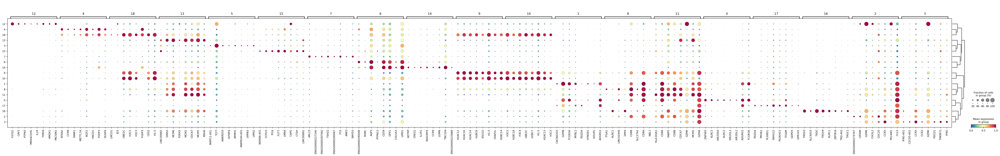

In [243]:
#cosg差异
cosg.cosg(adata, key_added=f'cosg_{groupby}', groupby=groupby,
          mu=10,n_genes_user=100,remove_lowly_expressed=True,
         )
df_tmp = pd.DataFrame(adata.uns[f'cosg_{groupby}']['names'])
df_tmp.to_csv(f"{obj_path}{celltype}/cosg_{groupby}.csv")
#cosg差异作图
df_tmp=pd.DataFrame(adata.uns[f'cosg_{groupby}']['names'][:8,]).T
df_tmp=df_tmp.reindex(adata.uns['dendrogram_'+groupby]['categories_ordered'])
marker_genes_list={idx: list(row.values) for idx, row in df_tmp.iterrows()}
marker_genes_list = {k: v for k, v in marker_genes_list.items() if not any(isinstance(x, float) for x in v)}
sc.pl.dotplot(adata, marker_genes_list,
             groupby=groupby,
             dendrogram=True,
             swap_axes=False,
             standard_scale='var',
             save=f'cosg_{groupby}',
             cmap='Spectral_r')

In [ ]:
fig, axs = plt.subplots(ncols=4, nrows=2, figsize=(16, 8))
sc.pl.umap(adata, color=groupby,legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,0],show=False,layer='denoised_protein')
sc.pl.umap(adt, color='CD45RA',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,1],show=False)
sc.pl.umap(adata, color='CTLA4',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,2],show=False)
sc.pl.umap(adata, color='FOXP3',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[0,3],show=False)
sc.pl.umap(adata, color='CTLA4',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[1,0],show=False)
sc.pl.umap(adata, color='PDCD1',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[1,1],show=False)
sc.pl.umap(adata, color='TIGIT',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[1,2],show=False)
sc.pl.umap(adata, color='IL2RA',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data',ax=axs[1,3],show=False)
plt.show()

In [ ]:
sc.pl.umap(adata, color='STMN1',legend_fontsize=4, legend_fontoutline=2,size=1,legend_loc='on data')

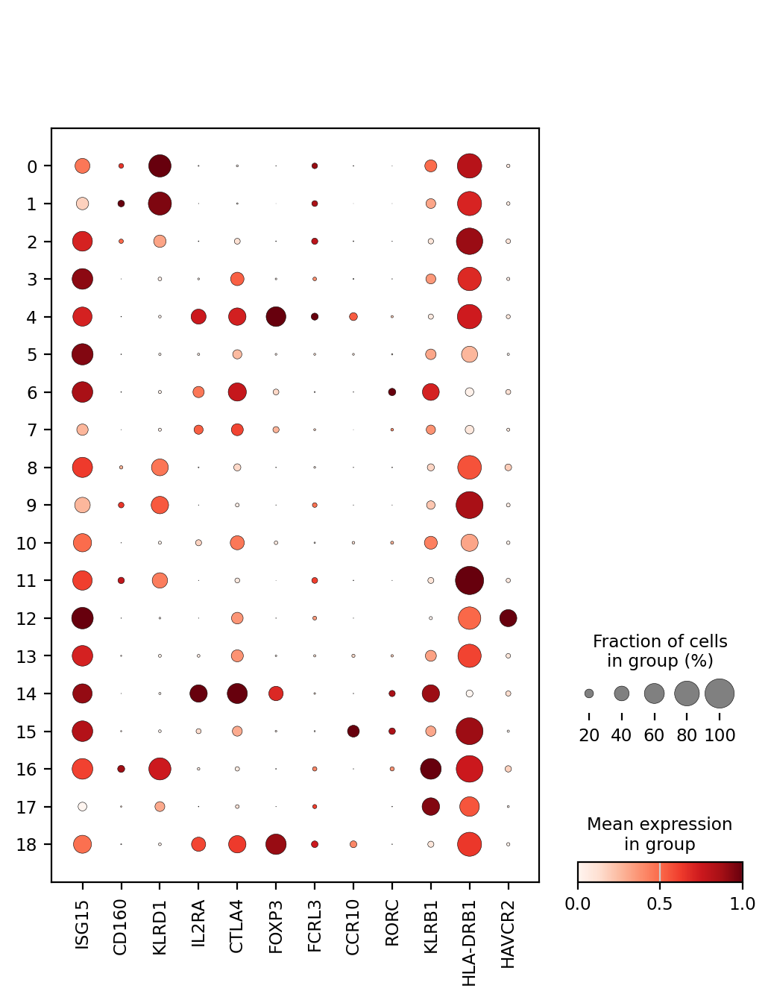

In [246]:
sc.pl.dotplot(adata, ['ISG15','CD160','KLRD1','IL2RA','CTLA4','FOXP3','FCRL3','CCR10','RORC','KLRB1','HLA-DRB1',
                     'HAVCR2'],
              standard_scale='var',groupby=groupby)

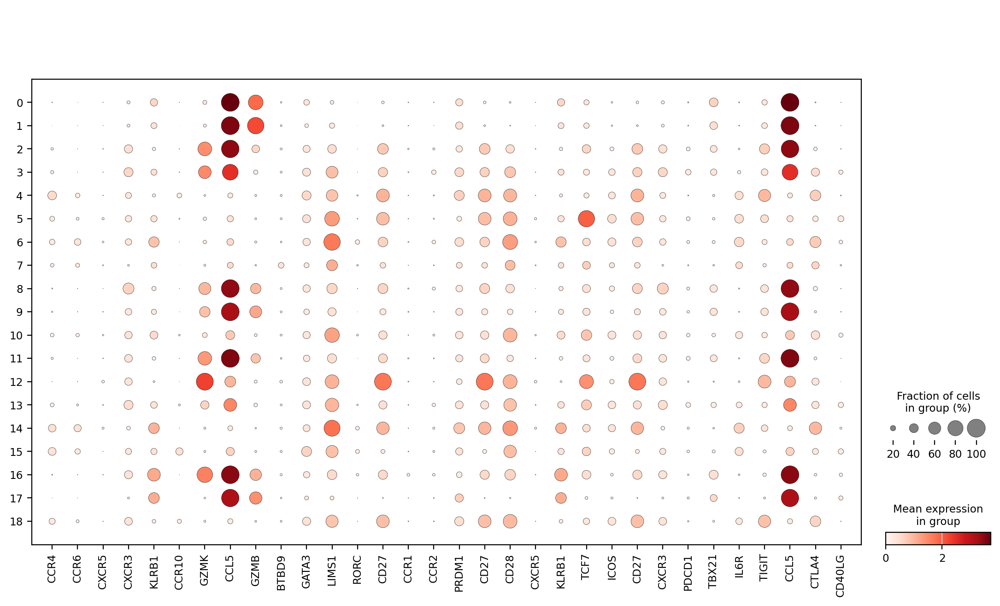

In [247]:
sc.pl.dotplot(adata, ['CCR4','CCR6','CXCR5','CXCR3','KLRB1','CCR10','GZMK','CCL5','GZMB','BTBD9','GATA3',
                      'LIMS1','RORC','CD27','CCR1','CCR2','PRDM1','CD27','CD28','CXCR5','KLRB1',
                      'TCF7','ICOS','CD27','CXCR3','PDCD1','TBX21','IL6R','TIGIT',
                      'CCL5','CTLA4','CD40LG'],
              standard_scale='obs',groupby=groupby)

In [588]:
adata.obs[groupby].value_counts()

L4_leiden_TOTALVI_1.5
1     3154
14    3132
10    3121
11    2808
4     2658
2     2418
13    2112
9     2074
6     2073
5     1885
8     1619
0     1171
18    1022
7     1008
15     813
12     714
3      448
17     313
16     253
Name: count, dtype: int64

In [589]:
#增殖CD38 MKI67 STMN1

cell_dict = {
            'Proliferative Treg CD4+':['4','14','18'],
            'Proliferative Temra CD8+ T':['0','1','9',],
            'Proliferative memory CD8+ T':['2','11','8',],
            'Proliferative memory CD4+ T':['3','5','6','10','13','15'],
            'Proliferative Cytotoxic CD4+ T':['17'],
    'Proliferative Dn T':['12'],#
    'Proliferative γδT T':['16'],#
            'Doublet|Lowquality':['7',#ARL15 BTBD9
                                 ],#
            }

In [590]:
check_dict_duplicates(cell_dict)

'无重复'

In [591]:
# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata.obs[groupby]).isin(cell_dict[i])
    adata.obs.loc[ind,'Celltype_L4_L5_Refine'] = i

In [592]:
(adata.obs['Celltype_L4_L5_Refine'].isna()).value_counts()

Celltype_L4_L5_Refine
False    32796
Name: count, dtype: int64

In [593]:
adata.obs['Celltype_L4_L5_Refine'].value_counts()

Celltype_L4_L5_Refine
Proliferative memory CD4+ T       10452
Proliferative memory CD8+ T        6845
Proliferative Treg CD4+            6812
Proliferative Temra CD8+ T         6399
Doublet|Lowquality                 1008
Proliferative Dn T                  714
Proliferative Cytotoxic CD4+ T      313
Proliferative γδT T                 253
Name: count, dtype: int64

In [594]:
adata = adata[adata.obs['Celltype_L4_L5_Refine'] != "Doublet|Lowquality",:]

In [595]:
adata.obs['Celltype_L4_L5_Refine'].value_counts()

Celltype_L4_L5_Refine
Proliferative memory CD4+ T       10452
Proliferative memory CD8+ T        6845
Proliferative Treg CD4+            6812
Proliferative Temra CD8+ T         6399
Proliferative Dn T                  714
Proliferative Cytotoxic CD4+ T      313
Proliferative γδT T                 253
Name: count, dtype: int64

In [596]:
indices = adata.obs.loc[:,['Celltype_L1_L2','Celltype_L1_L2_Refine','Celltype_L2_L3_Refine','Celltype_L3_L4_Refine','Celltype_L4_L5_Refine','receptor_type','receptor_type_BCR']]
indices.to_csv(f"{obj_path}/{celltype}/R4_refine_indices_{celltype}.csv")

# 合并所有数据

## PBMC et. al.

In [45]:
try:
    del indices_dict,combined_indices,Finnal_indices_dict,combined_Finnal_indices_dict,Processing_combined_indices
except:
    print("It is None!")

It is None!


## 终版

In [46]:
celltypes=['AtypicalB',
           'Basophil','CEACAM8_Pos_Neutrophil','CEACAM8_Neg_Neutrophil',
           'DC','DnT',
           'HSPC',
           'iNKT','Mast','Memory_B',
           'Monocyte','NaiveB','NaiveCD4','NaiveCD8','NK', 
           'Non_NK_ILC','Plasma','Platelet'
]

In [47]:
Finnal_indices_dict= []
for i in tqdm(celltypes):
    indices = pd.read_csv(f'{finnal_path}{i}/Finnal_indices_{i}.csv',index_col=0)
    Finnal_indices_dict.append(indices)

100%|██████████| 18/18 [00:47<00:00,  2.67s/it]


In [48]:
combined_Finnal_indices_dict = pd.concat(Finnal_indices_dict)

In [64]:
combined_Finnal_indices_dict['Celltype_L4_L5_Refine'].value_counts()

Celltype_L4_L5_Refine
Naïve CD8+ T                  1235329
Atypical memory CD27+ IgD+      28712
Atypical memory CD27- IgD-      14713
Atypical naïve                  11697
Atypical memory CD27+ IgD-       8935
Name: count, dtype: int64

## 过程

In [51]:
%%bash
ls /home/liyanguo/MyImmuCell/05_MyImmuCell_subpopulation/Level2_Refine_R4/ | wc -l
ls /home/liyanguo/MyImmuCell/05_MyImmuCell_subpopulation/Level2_Refine_R4/*/R4_refine* | wc -l
ls /home/liyanguo/MyImmuCell/05_MyImmuCell_subpopulation/Finnal/ | wc -l

11
9
18


In [52]:
celltypes=['TregCD8',
           'TregCD4',
           'CD4_helper_memory',
           'CytotoxicCD4',
           'CD8Tcm',
           'TemCD8',
           'MAIT',
           'gdT',
           'ProliferativeT',
          ]

In [53]:
indices_dict= []
for i in tqdm(celltypes):
    indices = pd.read_csv(f'{obj_path}{i}/R4_refine_indices_{i}.csv',index_col=0)
    indices_dict.append(indices)

100%|██████████| 9/9 [00:09<00:00,  1.09s/it]


In [54]:
Processing_combined_indices = pd.concat(indices_dict)

In [55]:
combined_indices = pd.concat([Processing_combined_indices,combined_Finnal_indices_dict])

In [56]:
combined_indices['Celltype_L1_L2'].isna().value_counts()

Celltype_L1_L2
False    52285576
Name: count, dtype: int64

In [57]:
combined_indices['Celltype_L1_L2_Refine'].isna().value_counts()

Celltype_L1_L2_Refine
False    52285576
Name: count, dtype: int64

In [58]:
combined_indices['Celltype_L2_L3_Refine'].isna().value_counts()

Celltype_L2_L3_Refine
False    52285576
Name: count, dtype: int64

In [59]:
combined_indices['Celltype_L3_L4_Refine'].isna().value_counts()

Celltype_L3_L4_Refine
True     37417894
False    14867682
Name: count, dtype: int64

In [60]:
combined_indices['Celltype_L4_L5_Refine'].isna().value_counts()

Celltype_L4_L5_Refine
True     42117434
False    10168142
Name: count, dtype: int64

In [61]:
combined_indices['Celltype_L4_L5_Refine'].value_counts()

Celltype_L4_L5_Refine
Tem GZMB+ CD8+ T                  1739137
Naïve CD8+ T                      1235329
Tfh                               1044251
Vδ2 T                              945069
Tem GZMK+ CD8+ T                   908690
Cytotoxic CD4+ T                   835606
Temra CD8+ T                       817435
Th1/Th17                           327575
MAIT                               322468
Th22                               306655
Treg memory CD4+ T                 303528
T help Memory(fromTreg)            269636
Tem HLA-DRhi CD8+ T                268758
Th17                               223863
Treg Naive CD4+ T                  169279
Tcm CCR4+ CCL5- CD8+ T              96425
Th1                                 83954
Th2                                 77564
Naive Vδ1 T                         35677
Tcm CCR4- CCL5+ CD8+ T              33532
Atypical memory CD27+ IgD+          28712
Vδ1 T                               15764
Atypical memory CD27- IgD-          14713
Atypical naï

## save

In [62]:
def save_to_indices(celltype,celltype_to_file):
    L2_refine_path_R5 = '/home/liyanguo/MyImmuCell/05_MyImmuCell_subpopulation/Level2_Refine_R5'
    indices=combined_indices['Celltype_L4_L5_Refine'].isin(celltype)
    indices_celltype=combined_indices[indices]
    print(f"{indices_celltype['Celltype_L4_L5_Refine'].value_counts()}")
    os.makedirs(f'{L2_refine_path_R5}/{celltype_to_file}', exist_ok=True)
    indices_celltype.to_csv(f"{L2_refine_path_R5}/{celltype_to_file}/R5_indices_{celltype_to_file}.csv")

In [63]:
Processing_combined_indices['Celltype_L4_L5_Refine'].value_counts()

Celltype_L4_L5_Refine
Tem GZMB+ CD8+ T                  1739137
Tfh                               1044251
Vδ2 T                              945069
Tem GZMK+ CD8+ T                   908690
Cytotoxic CD4+ T                   835606
Temra CD8+ T                       817435
Th1/Th17                           327575
MAIT                               322468
Th22                               306655
Treg memory CD4+ T                 303528
T help Memory(fromTreg)            269636
Tem HLA-DRhi CD8+ T                268758
Th17                               223863
Treg Naive CD4+ T                  169279
Tcm CCR4+ CCL5- CD8+ T              96425
Th1                                 83954
Th2                                 77564
Naive Vδ1 T                         35677
Tcm CCR4- CCL5+ CD8+ T              33532
Vδ1 T                               15764
Proliferative memory CD4+ T         10452
Proliferative memory CD8+ T          7508
Proliferative Treg CD4+              6812
Proliferativ

In [578]:
save_to_indices(celltype=['MAIT',],celltype_to_file='MAIT')

Celltype_L4_L5_Refine
MAIT    322468
Name: count, dtype: int64


In [597]:
save_to_indices(celltype=['Proliferative memory CD4+ T',
                          'Proliferative memory CD8+ T',
                          'Proliferative Treg CD4+',
                          'Proliferative Temra CD8+ T',
                          'Proliferative Dn T',
                          'Proliferative Cytotoxic CD4+ T',
                          'Proliferative γδT T',
                          ],celltype_to_file='ProliferativeT')

Celltype_L4_L5_Refine
Proliferative memory CD4+ T       10452
Proliferative memory CD8+ T        7508
Proliferative Treg CD4+            6812
Proliferative Temra CD8+ T         6399
Proliferative Dn T                  714
Proliferative Cytotoxic CD4+ T      313
Proliferative γδT T                 253
Name: count, dtype: int64


In [90]:
save_to_indices(celltype=['Naive Vδ1 T','Vδ1 T'],celltype_to_file='Vd1')
save_to_indices(celltype=['Vδ2 T',],celltype_to_file='Vd2')

Celltype_L4_L5_Refine
Naive Vδ1 T    35677
Vδ1 T          15764
Name: count, dtype: int64
Celltype_L4_L5_Refine
Vδ2 T    945069
Name: count, dtype: int64


In [581]:
save_to_indices(celltype=['Treg CD8+ T'],celltype_to_file='TregCD8')
save_to_indices(celltype=['Treg memory CD4+ T','Treg Naive CD4+ T',],celltype_to_file='TregCD4')

Celltype_L4_L5_Refine
Treg CD8+ T    6264
Name: count, dtype: int64
Celltype_L4_L5_Refine
Treg memory CD4+ T    303528
Treg Naive CD4+ T     169279
Name: count, dtype: int64


In [92]:
save_to_indices(celltype=['Cytotoxic CD4+ T'],celltype_to_file='CytotoxicCD4')

Celltype_L4_L5_Refine
Cytotoxic CD4+ T    835606
Name: count, dtype: int64


In [93]:
save_to_indices(celltype=['Tfh','Th1/Th17','Th22','Th17','Th1','Th2','T help Memory(fromTreg)'],celltype_to_file='CD4_helper_memory')

Celltype_L4_L5_Refine
Tfh                        1044251
Th1/Th17                    327575
Th22                        306655
T help Memory(fromTreg)     269636
Th17                        223863
Th1                          83954
Th2                          77564
Name: count, dtype: int64


In [583]:
save_to_indices(celltype=['Tem GZMB+ CD8+ T','Tem GZMK+ CD8+ T','Temra CD8+ T','Tem HLA-DRhi CD8+ T',],celltype_to_file='TemCD8')
save_to_indices(celltype=['Tcm CCR4- CCL5+ CD8+ T','Tcm CCR4+ CCL5- CD8+ T','Tcm'],celltype_to_file='CD8Tcm')

Celltype_L4_L5_Refine
Tem GZMB+ CD8+ T       1739137
Tem GZMK+ CD8+ T        908690
Temra CD8+ T            817435
Tem HLA-DRhi CD8+ T     268758
Name: count, dtype: int64
Celltype_L4_L5_Refine
Tcm CCR4+ CCL5- CD8+ T    96425
Tcm CCR4- CCL5+ CD8+ T    33532
Tcm                        5175
Name: count, dtype: int64
